In [2]:
import random
import numpy.random as rnd

from anytree import Node
from tqdm import tqdm
import numpy as np
import os
import sys
if(sys.version_info[1]<= 7):
    import pickle5 as pickle
else:
    import pickle
import json

from scipy.integrate import odeint
import scipy.special as sps
import scipy.optimize as spo
from scipy.integrate import odeint
#import interp1d
import scipy.optimize as so
from scipy.interpolate import interp1d

# from jupyter_server import serverapp as app; 
# import ipykernel, requests;

from mesa import Model, Agent
from mesa.time import RandomActivation
from mesa.datacollection import DataCollector

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib as mpl
from matplotlib.ticker import FuncFormatter
from numba import jit

#matplotlib.use('TkAgg')
from matplotlib.lines import Line2D
plt.rc('mathtext', default='regular')


plt.rc('lines', linewidth=3.0)
plt.rcParams['xtick.labelsize']=30
plt.rcParams['ytick.labelsize']=30
plt.rcParams['axes.labelsize']=35
plt.rcParams['legend.fontsize']= 35
plt.rcParams['figure.figsize'] = (20, 10)
plt.rcParams['image.cmap']='coolwarm'
plt.rcParams['axes.titlesize'] = 40
plt.rcParams['figure.titlesize'] = 40
#set legend titlesize to 40
plt.rcParams['legend.title_fontsize'] = 40

In [3]:
home = os.path.expanduser("~")
project_path =  os.path.relpath("..")
if project_path not in sys.path:
    sys.path.append(project_path)

sys.path.insert(1, project_path)
output_folder= project_path+'/outputs/'

In [4]:
import analysis.mathematical_functions.funcs as funcs

In [5]:
data_folder = project_path+'/data/parameter_runs/many_kappas/'
data_files = os.listdir(data_folder)
data_files = [data_folder+'/'+f for f in data_files if f.endswith('_feather')]
dataframes = [pd.read_feather(f) for f in data_files]

In [6]:
data_files

['../data/parameter_runs/many_kappas//01-10-19--04-06-2023abm_result_feather']

In [7]:
if len(dataframes)==1:
    datadf = dataframes[0]

In [8]:
datadf['first_tb'].unique()

array([29.47310585, 20.68064554,         inf, ..., 10.84717367,
        5.99631146,  3.10555556])

In [9]:

@jit(nopython=True)
def p_surv(fit,t_lim,dt,reg= 1e-3):
    L = len(fit)
    pi_ext_ode_hand_inv_t = np.zeros(L)
    pi_ext_ode_hand_inv_t[-1] = np.minimum(1/(1+fit[-1]),1-reg)
    for i in range(L-1):
        pi_ext= pi_ext_ode_hand_inv_t[L-1-i]
        pi_ext_ode_hand_inv_t[L-2-i] = pi_ext -dt * (1-pi_ext)*(-1+pi_ext*(1+fit[L-2-i]))
    p_surv = 1-pi_ext_ode_hand_inv_t
    return p_surv
            

def product_sum_probas(S,I, t_lim, R0, kappa,xi,ds,dt, N, p_alpha):
    x,y = S/N, I/N
    z = 1-x-y
    
    fit_d = lambda d: R0/(1+y*kappa) * ( x + (1- np.exp(-d/xi))*z )-1

    product_sum = 0
    
    L = len(ds)
    for i in range(L):
        d= ds[i]
        fit = fit_d(d)
        p_surv_t = p_surv(fit,t_lim, dt)
        product_sum +=funcs.rho_d(d=d,p_alpha=p_alpha )*p_surv_t
    
    return product_sum

def product_sum_probas_adiabatic(S,I, t_lim, R0, kappa,xi,ds,dt, N, p_alpha):
    x,y = S/N, I/N
    z = 1-x-y
    
    fit_d = lambda d: R0/(1+y*kappa) * ( x + (1- np.exp(-d/xi))*z )-1

    product_sum = 0
    
    L = len(ds)
    for i in range(L):
        d= ds[i]
        fit = fit_d(d)
        p_surv_t = np.maximum(0,1 - 1/(1+fit))
        product_sum +=funcs.rho_d(d=d,p_alpha=p_alpha )*p_surv_t
    
    return product_sum

In [10]:


def model_w_params(R0, N, k): 
    def model(y,t):
        S = y[0]
        I = y[1]
        R0_eff = R0/(1+k*I/(N))
        dSdt = - R0_eff * S*I/N 
        dIdt =  R0_eff * S*I/N -I
        return [dSdt,dIdt]
    return model

def find_x_inf(R0,k):
    if k>0:
        c = (R0-k+R0*k)/(k*(R0-k))
        rho = 1/(R0/k)
        y_x = lambda x: c*x**rho + x/(rho-1) - 1/k

        roots = so.fsolve(y_x, 0)
        return roots[0]
    else:
        return np.real(-1/R0*sps.lambertw(-R0*np.exp(-R0)))

def integrate_trajectory(R0,kappa,N, I0=10):
    S0 = N-I0
    y0 = [S0,I0]
    x_inf = find_x_inf(R0,kappa)
    
    t_end = 3*np.log(N)* (1/(R0-1) + 1/(1-R0*x_inf))
    ts = np.linspace(0, t_end,10000)
    dt = ts[1]-ts[0]
    y = odeint(model_w_params(R0,N,kappa),y0,ts).T

    return ts, y

def get_exp_num_established(R0, kappa, p_alpha,xi, N,pbar = None):
    ts, solution= integrate_trajectory(R0,kappa,N)
    ds = np.arange(1,int(10/p_alpha)+1)

    S,I = solution
    t2 = ts[-1]
    dt = ts[1]-ts[0]
    idx_times = ts<t2
    prod_sum_prob = product_sum_probas(S,I, t2, R0, kappa,xi,ds,dt, N, p_alpha)

    try:
        exp_number_est_mutants = dt*np.sum(prod_sum_prob*I[idx_times])
    except ValueError:
        idx_times = ts<=t2
        exp_number_est_mutants = dt*np.sum(prod_sum_prob*I[idx_times])
    if pbar is not None:
        pbar.update(1)
    return exp_number_est_mutants

def get_exp_num_established_adiabatic(R0, kappa, p_alpha,xi, N,pbar = None):
    ts, solution= integrate_trajectory(R0,kappa,N)
    ds = np.arange(1,int(10/p_alpha)+1)

    S,I = solution
    t2 = ts[-1]
    dt = ts[1]-ts[0]
    idx_times = ts<t2
    prod_sum_prob = product_sum_probas_adiabatic(S,I, t2, R0, kappa,xi,ds,dt, N, p_alpha)
    try:
        exp_number_est_mutants = dt*np.sum(prod_sum_prob*I[idx_times])
    except ValueError:
        idx_times = ts<=t2
        exp_number_est_mutants = dt*np.sum(prod_sum_prob*I[idx_times])
    if pbar is not None:
        pbar.update(1)
    return exp_number_est_mutants

In [11]:
R0 = 2.5
N = 1e8
mu_s = np.logspace(0,3,501, base =10)/N
kappa_s = np.concatenate([np.array([0]), np.logspace(0,3,21,base=10)])
dbar = 50
delta_s= np.logspace(-2,0,30, base =10)
xi_s= dbar/delta_s
R0s = np.logspace(np.log10(1.5),1,10)

if os.path.exists(os.getcwd()+'/pickles/exp_t_dep_nums_df_modulo_mu_mountain_big_d_adiabb.feather'):
    exp_t_dep_nums_df_modulo_mu_mountain = pd.read_feather(os.getcwd()+'/pickles/exp_t_dep_nums_df_modulo_mu_mountain_big_d_adiabb.feather')
else:
    pbar = tqdm(total = len(kappa_s)*len(xi_s)*len(R0s))
    exp_t_dep_nums_df_modulo_mu_mountain = pd.DataFrame.from_dict(
        {i:(R0, kappa,  N, dbar, xi,
            get_exp_num_established_adiabatic(R0=R0, kappa = kappa, p_alpha=1/dbar,xi = xi, N=N, pbar = pbar)) 
            for i, (R0,kappa,xi) 
            in enumerate(
                funcs.product(R0s, kappa_s, xi_s))
                }, orient='index', columns=['R0', 'kappa', 'N', 'dbar', 'xi','exp_num_est_mutants_mod_mu'])
    exp_t_dep_nums_df_modulo_mu_mountain.to_feather(os.getcwd()+'/pickles/exp_t_dep_nums_df_modulo_mu_mountain_big_d_adiabb.feather')

In [12]:
evolution_pd = pd.DataFrame(columns=['R0', 'kappa', 'N', 'mu', 'dbar', 'xi','exp_num_est_mutants_mod_mu'])

for mu in mu_s:
    evolution_pd = pd.concat([evolution_pd, exp_t_dep_nums_df_modulo_mu_mountain.assign(mu=mu)], ignore_index=True)
    
evolution_pd['exp_num_est_mutants'] = evolution_pd['exp_num_est_mutants_mod_mu']*evolution_pd['mu']
evolution_pd['p_evo']= 1- np.exp(-evolution_pd['exp_num_est_mutants'])
evolution_pd['scaled_dbar'] = evolution_pd['dbar']/evolution_pd['xi']
# evolution_pd['scaled_dbar'] = np.round(evolution_pd['scaled_dbar'].astype(float),1)
evolution_pd['muN'] = evolution_pd['mu']*evolution_pd['N']
evolution_pd['kappa_plot'] = 1 + evolution_pd['kappa']

/var/folders/r0/2r01pw2j68bcxs_rw3gqyh880000gn/T/ipykernel_29163/1791401464.py:4: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  evolution_pd = pd.concat([evolution_pd, exp_t_dep_nums_df_modulo_mu_mountain.assign(mu=mu)], ignore_index=True)


In [13]:
evolution_pd

,R0,kappa,N,mu,dbar,xi,exp_num_est_mutants_mod_mu,exp_num_est_mutants,p_evo,scaled_dbar,muN,kappa_plot
0,1.5,0.0,100000000.0,1.000000e-08,50,5000.000000,4.851578e+06,0.048516,0.047358,0.01,1.0,1.0
1,1.5,0.0,100000000.0,1.000000e-08,50,4265.839262,4.859070e+06,0.048591,0.047429,0.011721,1.0,1.0
2,1.5,0.0,100000000.0,1.000000e-08,50,3639.476922,4.867887e+06,0.048679,0.047513,0.013738,1.0,1.0
3,1.5,0.0,100000000.0,1.000000e-08,50,3105.084709,4.878270e+06,0.048783,0.047612,0.016103,1.0,1.0
4,1.5,0.0,100000000.0,1.000000e-08,50,2649.158453,4.890511e+06,0.048905,0.047729,0.018874,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
3306595,10.0,1000.0,100000000.0,1.000000e-05,50,94.369591,2.172050e+07,217.205039,1.000000,0.529832,1000.0,1001.0
3306596,10.0,1000.0,100000000.0,1.000000e-05,50,80.513101,2.313492e+07,231.349185,1.000000,0.621017,1000.0,1001.0
3306597,10.0,1000.0,100000000.0,1.000000e-05,50,68.691190,2.453313e+07,245.331339,1.000000,0.727895,1000.0,1001.0
3306598,10.0,1000.0,100000000.0,1.000000e-05,50,58.605115,2.590322e+07,259.032166,1.000000,0.853168,1000.0,1001.0


KeyboardInterrupt: 

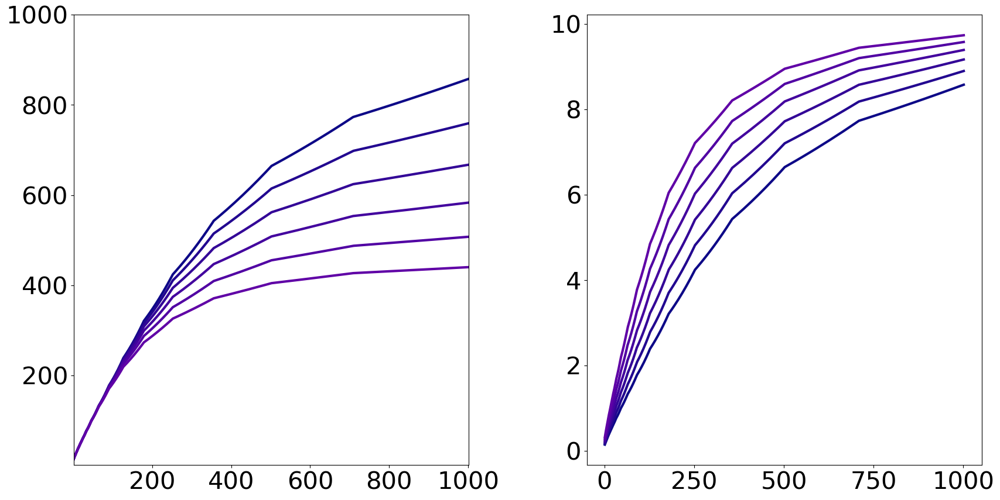

In [14]:
colors_scaled_dbar= funcs.color_dict(evolution_pd['scaled_dbar'].unique(),plt.cm.plasma)

for R0 in R0s:
    fig,ax= plt.subplots(1,2,figsize=(20,10))
    plt.subplots_adjust(wspace=0.3)

    delta_s_from_df = evolution_pd['scaled_dbar'].unique()
    for scaled_dbar in delta_s_from_df:
        mini_df = (evolution_pd
            .query(f'R0=={R0} and scaled_dbar=={scaled_dbar}')
            .groupby(['kappa_plot', 'muN'])
            .mean()
            .reset_index())
        
        muN_vals = mini_df['muN'].unique()
        kappa_vals = mini_df['kappa_plot'].unique()
        p_evo_vals = mini_df.pivot(index='muN', columns='kappa_plot', values='p_evo').values

        C =ax[0].contour(kappa_vals, muN_vals, p_evo_vals, levels=[0.5],alpha=0)
        Cx, Cy = C.allsegs[0][0].T
        ax[0].plot(Cx, Cy, color=colors_scaled_dbar[scaled_dbar], label = rf'${scaled_dbar:.2e}$')
        ax[1].plot(Cx, Cy*scaled_dbar, color=colors_scaled_dbar[scaled_dbar], label = rf'${scaled_dbar:.2e}$')

    ax[0].set_xlim(ax[0].get_xlim()*np.array([.5,2]))
    ax[1].set_xlim(ax[0].get_xlim())
    ax[0].set_ylim(ax[0].get_ylim()*np.array([.5,2]))
    ax[1].set_ylim(ax[1].get_ylim()*np.array([.5,2]))

    for xi in xi_s:
        delta = dbar/xi
        
        p_alpha= 1/dbar
        exp_val_kappa_inf = mu*N/(xi*p_alpha) * ((R0-1)/R0)**2 /2 # exp must be log 2
        exp_val_kappa0 = mu*N*np.log(R0)/(R0)*np.power(R0/(R0-1),-xi*p_alpha) # exp must be log 2

        equal_proba_point_kappa0 = np.log(2)/(np.log(R0)/(R0)*np.power(R0/(R0-1),-xi*p_alpha))
        equal_proba_point_kappa_inf = np.log(2)/(((R0-1)/R0)**2 /2)*(xi*p_alpha)
        # p_evo_kappa0 = 1- np.exp(-mu*N*np.log(R0)/(R0)*np.power(R0/(R0-1),-xi*p_alpha) )
        ax[0].scatter(1,equal_proba_point_kappa0, marker='x', color=colors_scaled_dbar[delta],s=80)
        ax[0].scatter(1.5*kappa_s[-1] ,equal_proba_point_kappa_inf, s=10, marker='o',color=colors_scaled_dbar[delta])


    handles, labels= ax[0].get_legend_handles_labels()
    handles = handles[::3]
    labels = labels[::3]


    ax[0].set_yscale('log')
    ax[0].set_xscale('log')
    ax[0].set_xlabel(r'')
    ax[0].set_ylabel(r'')
    ax[1].set_xlabel(r'')
    ax[1].set_ylabel(r'')

    ax[1].set_xscale('log')
    ylogged = True 

    if ylogged:
        ax[1].set_yscale('log')

    ax[0].set_ylim((1,2e3))
    ax[1].set_ylim((1,90))

    ax[1].legend(handles,labels, title= r'$\frac{\langle d\rangle}{\xi}$',loc=(1.01,0.1), fontsize=10)
    # os.makedirs(os.getcwd()+'/figures', exist_ok=True)
    # plt.savefig(os.getcwd()+f'/figures/phase_diagram_mountain_logy{ylogged}.pdf', bbox_inches='tight')

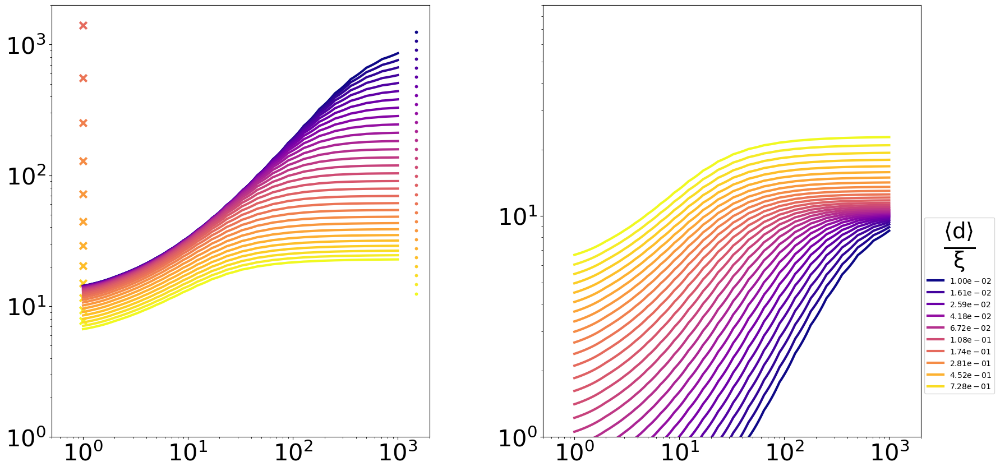

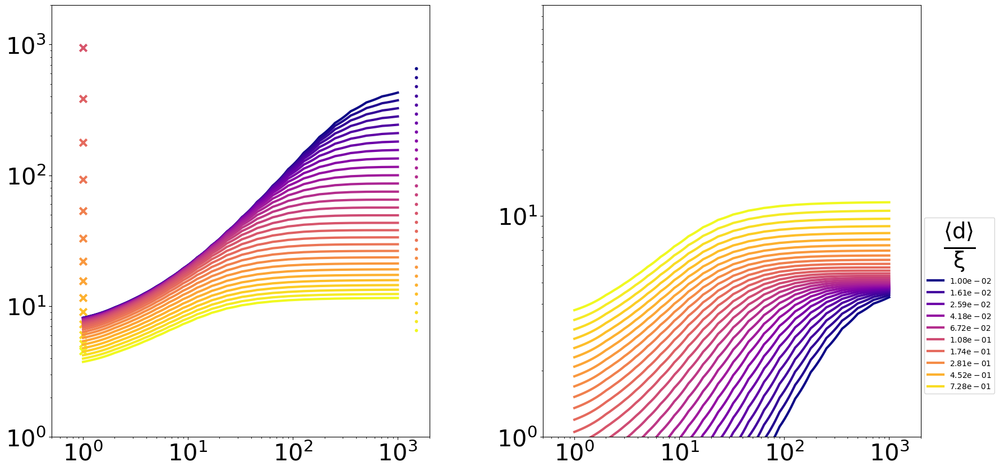

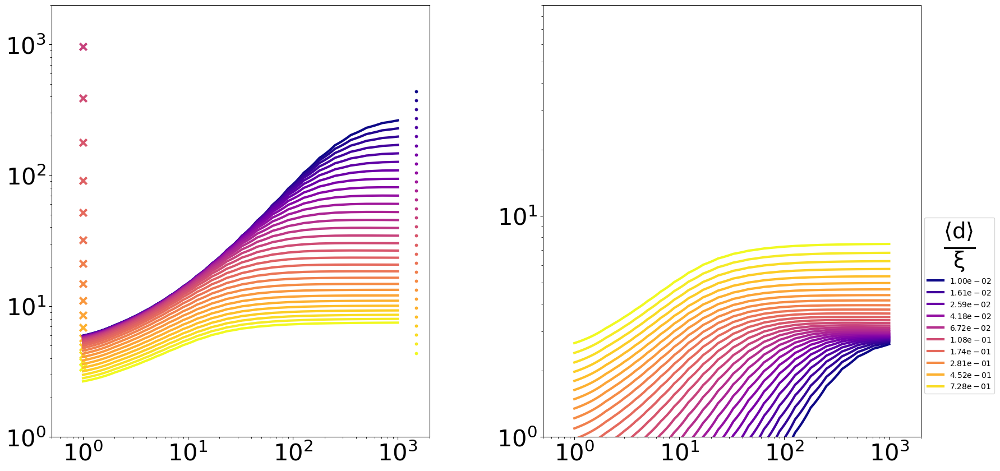

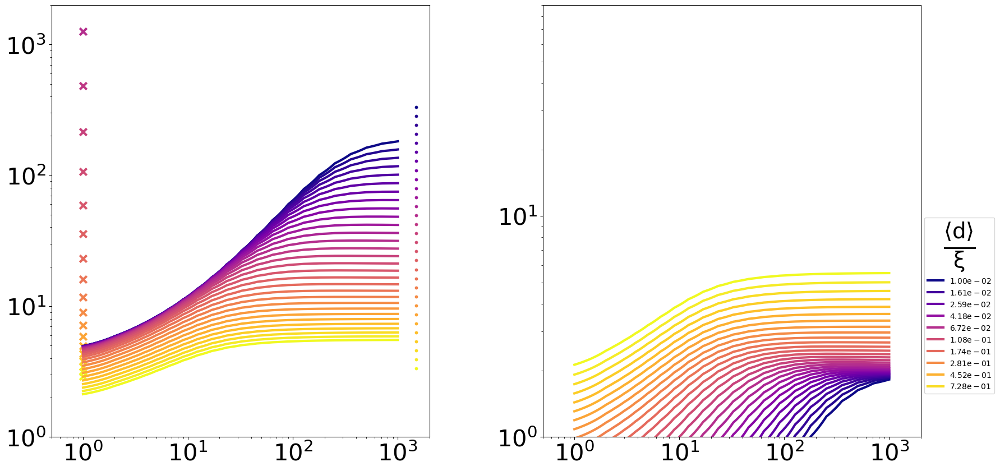

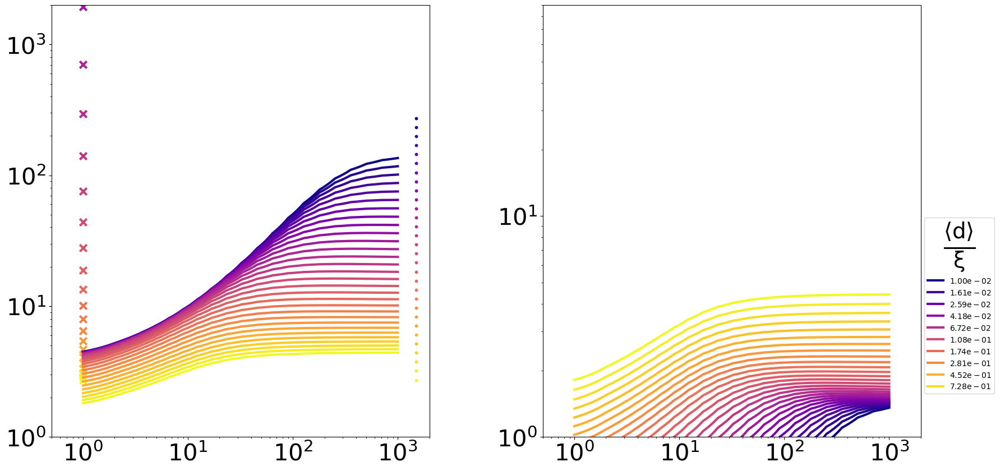

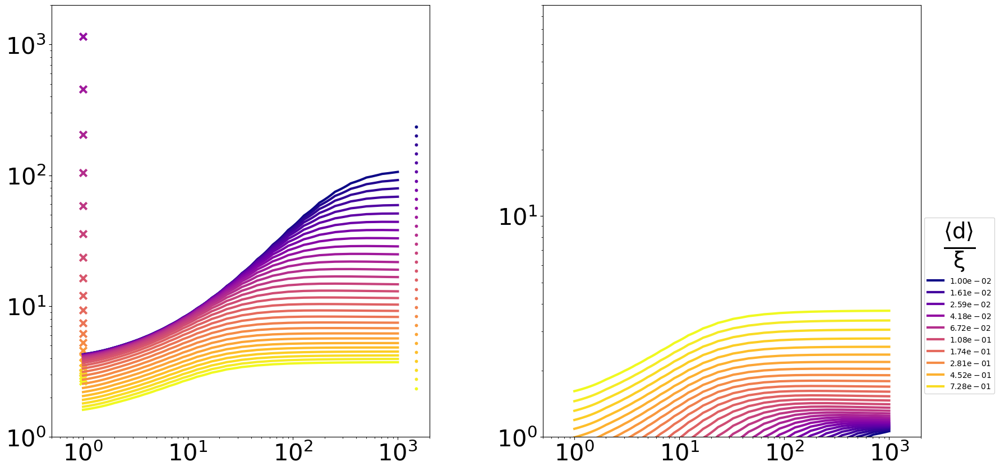

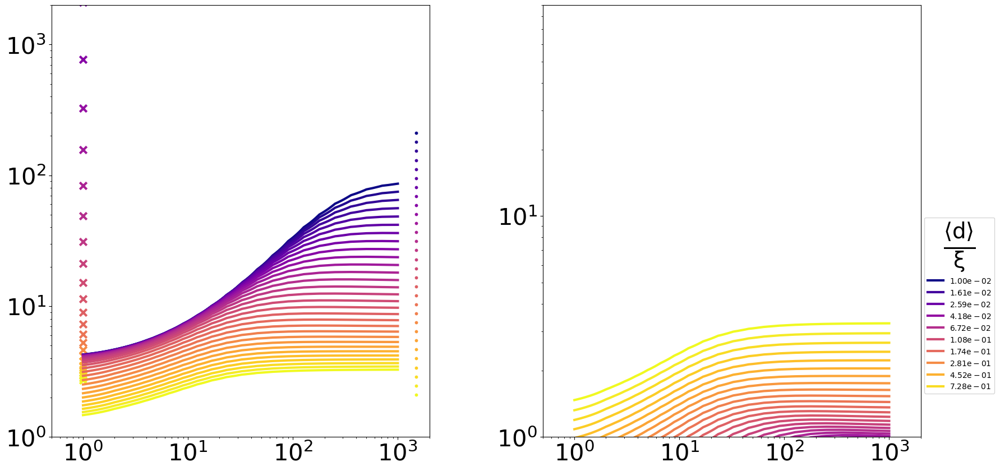

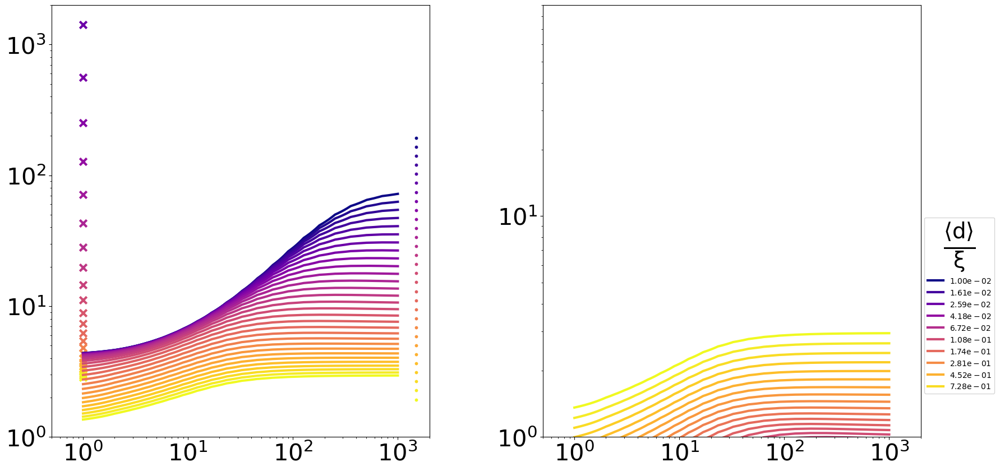

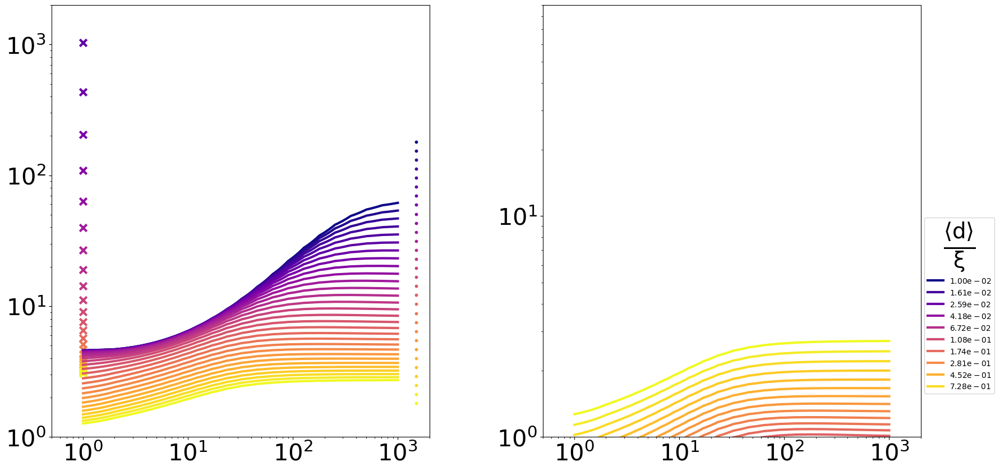

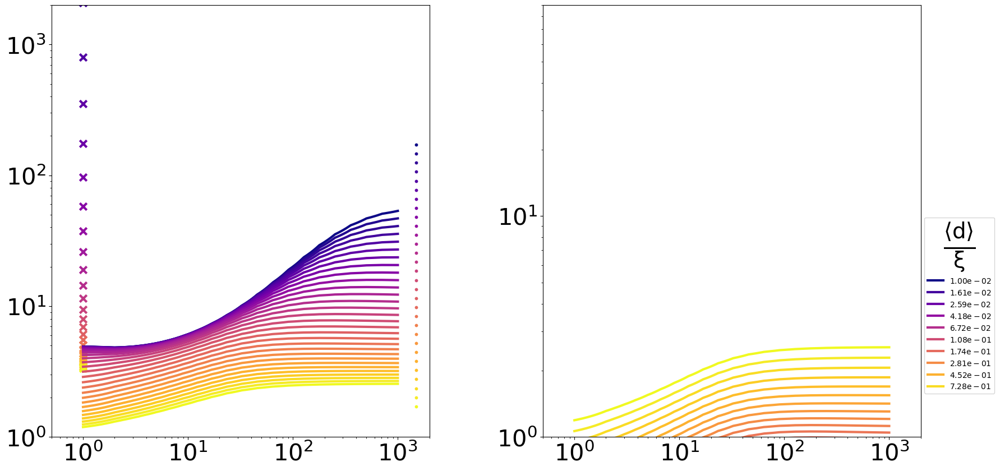

In [ ]:
colors_scaled_dbar = funcs.color_dict(evolution_pd['scaled_dbar'].unique(), plt.cm.plasma)

for R0 in R0s:
    fig, ax = plt.subplots(1, 2, figsize=(20, 10))
    plt.subplots_adjust(wspace=0.3)

    df_R0 = evolution_pd.query(f'R0 == {R0}').groupby(['kappa_plot', 'muN', 'scaled_dbar']).mean().reset_index()
    
    for scaled_dbar in df_R0['scaled_dbar'].unique():
        mini_df = df_R0[df_R0['scaled_dbar'] == scaled_dbar]

        # ensure kappa & muN are sorted for consistent pivoting
        kappa_vals = np.sort(mini_df['kappa_plot'].unique())
        muN_vals = np.sort(mini_df['muN'].unique())

        p_evo_pivot = mini_df.pivot(index='muN', columns='kappa_plot', values='p_evo')

        # ensure pivot table matches expected shape
        if p_evo_pivot.shape != (len(muN_vals), len(kappa_vals)):
            print(f"skipping scaled_dbar={scaled_dbar:.2e}: shape mismatch {p_evo_pivot.shape} vs expected {(len(muN_vals), len(kappa_vals))}")
            continue

        p_evo_vals = p_evo_pivot.values
        color = colors_scaled_dbar[scaled_dbar]

        C = ax[0].contour(kappa_vals, muN_vals, p_evo_vals, levels=[0.5], alpha=0)
        if C.allsegs[0]:  
            Cx, Cy = C.allsegs[0][0].T
            ax[0].plot(Cx, Cy, color=color, label=rf'${scaled_dbar:.2e}$')
            ax[1].plot(Cx, Cy * scaled_dbar, color=color, label=rf'${scaled_dbar:.2e}$')

    xlims = np.array(ax[0].get_xlim()) * np.array([0.5, 2])
    ylims_0 = np.array(ax[0].get_ylim()) * np.array([0.5, 2])
    ylims_1 = (1, 90)

    ax[0].set_xlim(xlims)
    ax[1].set_xlim(xlims)
    ax[0].set_ylim(ylims_0)
    ax[1].set_ylim(ylims_1)

    for xi in xi_s:
        delta = dbar / xi
        p_alpha = 1 / dbar
        exp_val_kappa_inf = mu * N / (xi * p_alpha) * ((R0 - 1) / R0) ** 2 / 2
        exp_val_kappa0 = mu * N * np.log(R0) / R0 * np.power(R0 / (R0 - 1), -xi * p_alpha)

        equal_proba_point_kappa0 = np.log(2) / (np.log(R0) / R0 * np.power(R0 / (R0 - 1), -xi * p_alpha))
        equal_proba_point_kappa_inf = np.log(2) / (((R0 - 1) / R0) ** 2 / 2) * (xi * p_alpha)

        ax[0].scatter(1, equal_proba_point_kappa0, marker='x', color=colors_scaled_dbar[delta], s=80)
        ax[0].scatter(1.5 * kappa_s[-1], equal_proba_point_kappa_inf, s=10, marker='o', color=colors_scaled_dbar[delta])

    handles, labels = ax[0].get_legend_handles_labels()
    ax[1].legend(handles[::3], labels[::3], title=r'$\frac{\langle d\rangle}{\xi}$', loc=(1.01, 0.1), fontsize=10)

    for a in ax:
        a.set_xscale('log')
        a.set_xlabel(r'')
        a.set_ylabel(r'')

    ax[0].set_yscale('log')
    ax[1].set_yscale('log')

    ax[0].set_ylim((1, 2e3))

In [ ]:
#import linalgerror

from scipy.linalg import LinAlgError

In [ ]:
import warnings

warnings.filterwarnings("ignore")

100%|██████████| 10/10 [02:24<00:00, 14.50s/it]


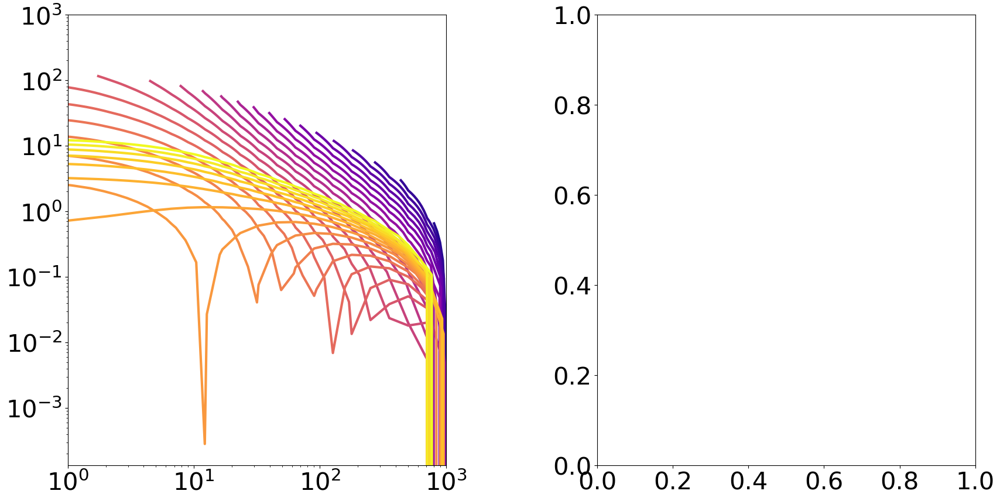

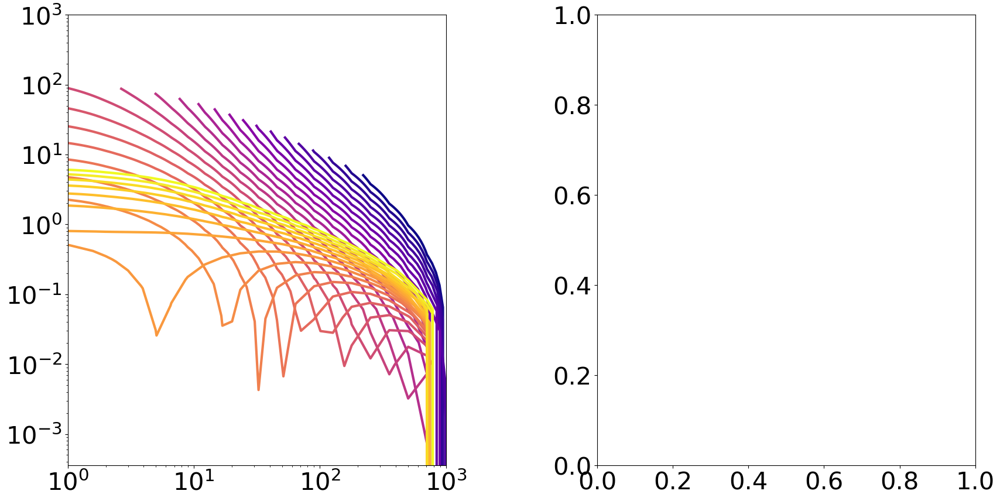

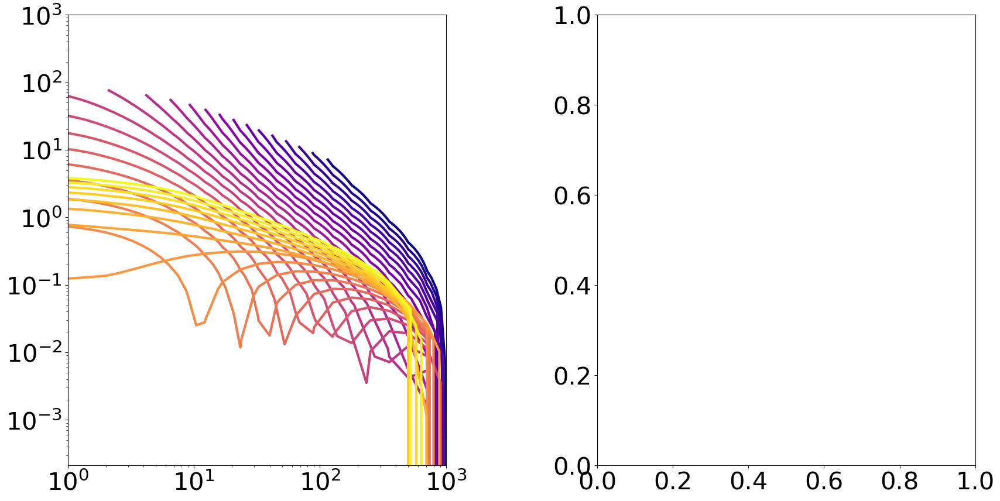

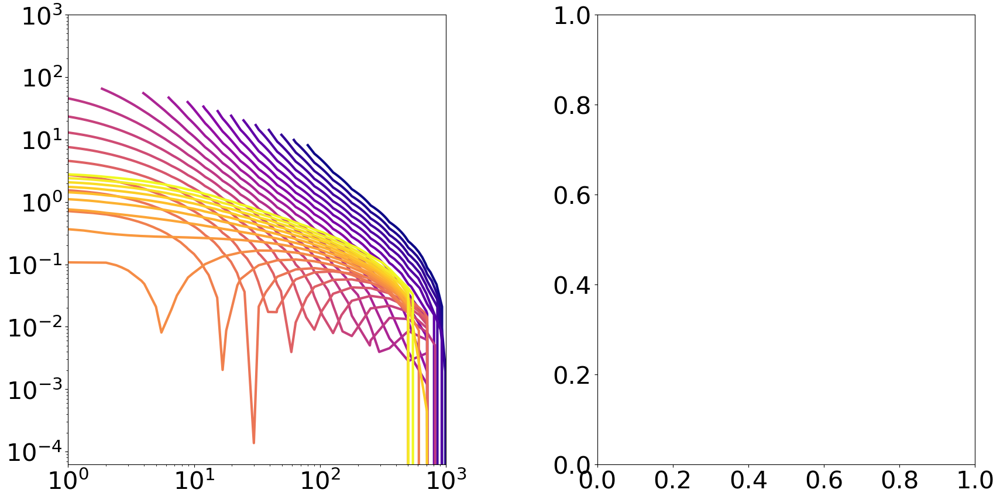

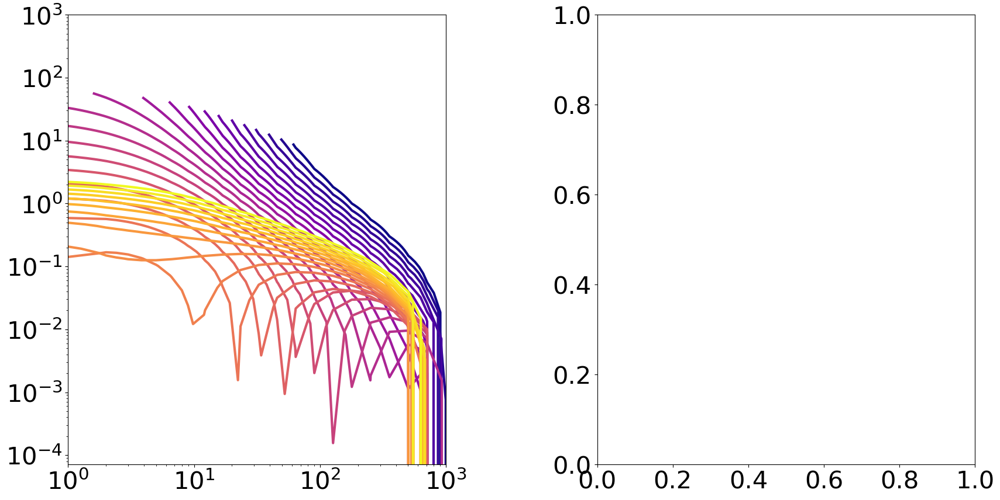

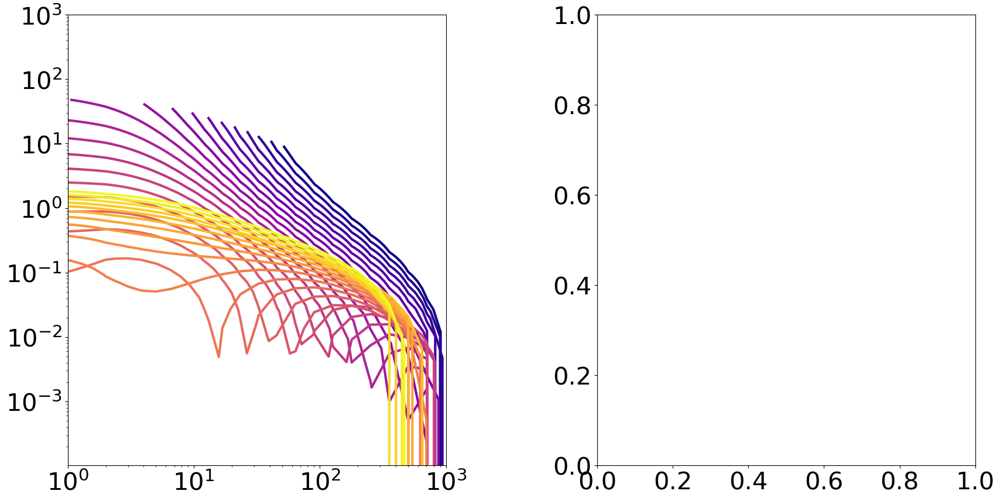

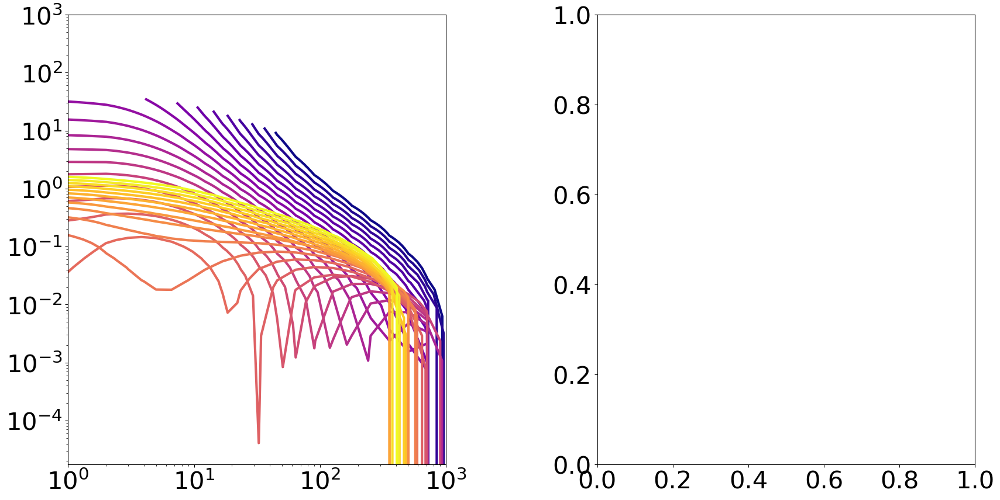

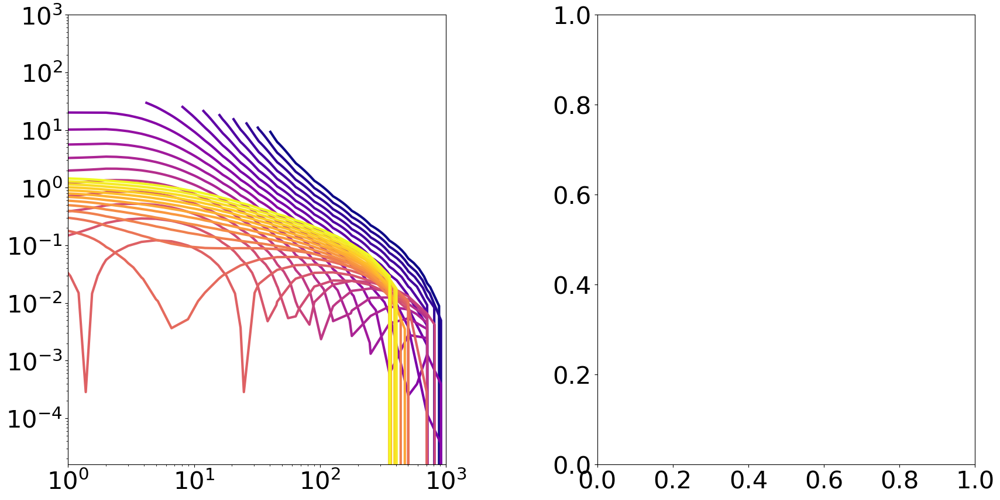

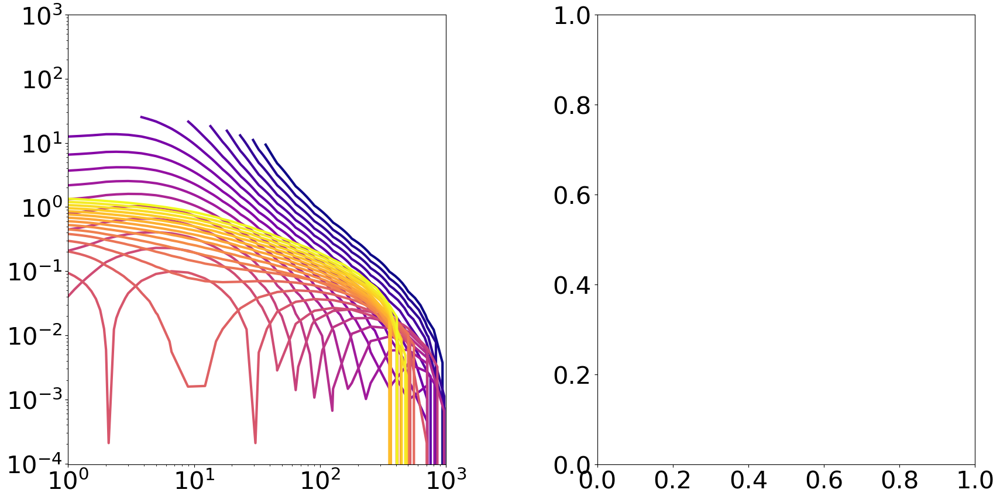

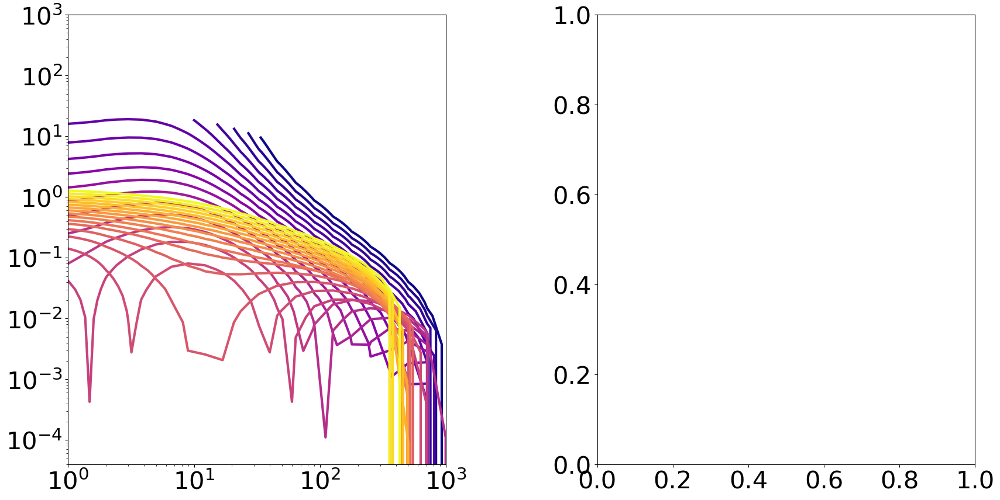

In [ ]:
exponents_dataframe = pd.DataFrame(columns=['R0', 'scaled_dbar', 'A', 'alpha'])
colors_scaled_dbar= funcs.color_dict(evolution_pd['scaled_dbar'].unique(),plt.cm.plasma)

fit_params = []
for R0 in tqdm(R0s):
    fig,ax= plt.subplots(1,2,figsize=(20,10))
    plt.subplots_adjust(wspace=0.4)

    delta_s_from_df = evolution_pd['scaled_dbar'].unique()
    for scaled_dbar in delta_s_from_df:
        mini_df = (evolution_pd
            .query(f'R0=={R0} and scaled_dbar=={scaled_dbar}')
            .groupby(['kappa_plot', 'muN'])
            .mean()
            .reset_index())
 
        muN_vals = mini_df['muN'].unique()
        kappa_vals = mini_df['kappa_plot'].unique()
        p_evo_vals = mini_df.pivot(index='muN', columns='kappa_plot', values='p_evo').values

        C =ax[0].contour(kappa_vals, muN_vals, p_evo_vals, levels=[0.5],alpha=0, colors=[colors_scaled_dbar[scaled_dbar]])
        Cx, Cy = C.allsegs[0][0].T
        rescaled_Cy = Cy*scaled_dbar
        try:
            rescaled_Cy = np.abs(rescaled_Cy - rescaled_Cy[-1])
            ax[0].plot(Cx, rescaled_Cy, color=colors_scaled_dbar[scaled_dbar], label = rf'${scaled_dbar:.2e}$')
            #fit Cx, rescaled_Cy to power law
            try:
                fit = np.polyfit(np.log(Cx)[:-2], np.log(rescaled_Cy)[:-2], 1)
                fit_fn = np.poly1d(fit)
                
                exponents_dataframe = pd.concat((exponents_dataframe, pd.DataFrame({'R0':R0, 'scaled_dbar':scaled_dbar, 'A':np.exp(fit_fn[0]), 'alpha':fit_fn[1]},index=[0] )))
            except LinAlgError:
                continue
            except TypeError:
                continue            
        except IndexError:
            continue

    # plt.close(fig)
        ax[0].set_xscale('log')
        ax[0].set_yscale('log')

In [ ]:
R0

10.0

In [ ]:
# pd.DataFrame({'R0':R0, 'scaled_dbar':scaled_dbar, 'A':np.exp(fit_fn[0]), 'alpha':fit_fn[1]}, index=[0]);
# exponents_dataframe = pd.concat((exponents_dataframe, pd.DataFrame({'R0':R0, 'scaled_dbar':scaled_dbar, 'A':np.exp(fit_fn[0]), 'alpha':fit_fn[1]},index=[0] )));
# pd.concat((exponents_dataframe, pd.DataFrame({'R0':R0, 'scaled_dbar':scaled_dbar, 'A':np.exp(fit_fn[0]), 'alpha':fit_fn[1]},index=[0] )))
exponents_dataframe

,R0,scaled_dbar,A,alpha
0,1.5,0.011721,1.037111e+23,-7.969765
0,1.5,0.013738,5.063233e+08,-3.096495
0,1.5,0.016103,4.332900e+06,-2.390883
0,1.5,0.018874,5.873115e+05,-2.109230
0,1.5,0.022122,1.416305e+05,-1.909280
...,...,...,...,...
0,10.0,0.529832,1.360919e+00,-0.528302
0,10.0,0.621017,1.505653e+00,-0.517878
0,10.0,0.727895,1.724844e+00,-0.523889
0,10.0,0.853168,1.924832e+00,-0.519581


In [ ]:
exponents_dataframe['kappa_star'] = exponents_dataframe['A']**(-1/exponents_dataframe['alpha'])

In [ ]:
delta

1.0

In [ ]:
R0s[3]

2.8231080866430855

In [ ]:
delta_s_from_df[18]

0.17433288221999882

In [ ]:
R0s[0]

1.5

In [ ]:
delta_s_from_df[16]

0.12689610031679222

In [ ]:
def get_yp(R0,kappa,N):
    ts, solution= integrate_trajectory(R0,kappa,N)
    S,I = solution
    x,y = S/N, I/N
    return np.max(y)



In [ ]:
# muN_vals

In [ ]:
np.log10(N)

8.0

In [ ]:
sps.lambertw(-R0*np.exp(-R0)).real

-0.0004542055534648269

In [ ]:
delta_s_from_df[18]

0.17433288221999882

In [ ]:
color=np.array((249,193,51))
color/255

array([0.97647059, 0.75686275, 0.2       ])

In [ ]:
import matplotlib as mpl
mpl.rcParams['hatch.linewidth'] = 0.1  # previous pdf hatch linewidth
mpl.rcParams['hatch.linewidth'] = 8.0  # previous svg hatch linewidth
from matplotlib.hatch import Shapes, HatchPattern



class CustomHatch(HatchPattern):
    def __init__(self, hatch, density):
        # Define the shape, rotation, and spacing of the hatches
        super().__init__(
            fill=False,
            shapes=[
                Shapes.horizontal(0, density)  # Adjust density for closer or sparser lines
            ]
        )

plt.register_hatch_pattern('custom_hatch', CustomHatch('/', 20))  # Smaller number = denser


ImportError: cannot import name 'HatchPattern' from 'matplotlib.hatch' (/Users/dennytrimcev/miniconda3/envs/paper_transition/lib/python3.12/site-packages/matplotlib/hatch.py)

In [ ]:
print(mpl.__version__)

3.8.4


In [1]:
colors_scaled_dbar= funcs.color_dict(evolution_pd['scaled_dbar'].unique(),plt.cm.plasma)
delta_s_from_df = evolution_pd['scaled_dbar'].unique()
fig_ghost,ax_ghost = plt.subplots(1,1,figsize=(1,1))
plt.close(fig_ghost)
for R0 in [R0s[3]]:
    fig,ax= plt.subplots(1,1,figsize=(10,10))
    plt.subplots_adjust(wspace=0.3)
    
    for i_d, scaled_dbar in enumerate(delta_s_from_df[np.array([15])]):
        mini_df = (evolution_pd
            .query(f'R0=={R0} and scaled_dbar=={scaled_dbar}')
            .groupby(['kappa_plot', 'muN'])
            .mean()
            .reset_index())
        muN_vals = mini_df['muN'].unique()
        kappa_vals = mini_df['kappa_plot'].unique()
        p_evo_vals = mini_df.pivot(index='muN', columns='kappa_plot', values='p_evo').values

        

        C =ax_ghost.contour(kappa_vals, muN_vals, p_evo_vals, levels=[0.5],alpha=0)
        Cx, Cy = C.allsegs[0][0].T
        rescaled_Cy = Cy*scaled_dbar
        rescaled_Cy_subtracted = np.abs(rescaled_Cy - rescaled_Cy[-1]+1e-4)
    
        #fit Cx, rescaled_Cy to power law
        try:
            fit = np.polyfit(np.log(Cx[:-1]), np.log(rescaled_Cy_subtracted)[:-1], 1)
            fit_fn = np.poly1d(fit)
            exponent = fit_fn[1] 
        except LinAlgError:
            continue   

        kstar = (R0/(R0-1))**2 /scaled_dbar
        rescaled_Cx = Cx/kstar
        xs= np.logspace(-2,3,500)
        kappa_xs= xs*kstar
        yp_vals = np.array([get_yp(R0,kappa,N) for kappa in kappa_xs])

        z_inf_inf = (R0-1)/R0
        if i_d ==0:
            color= 'k'
        else:
            # continue
            color='grey'

        equal_proba_point_kappa_inf = np.log(2)/((-z_inf_inf-np.log(1-z_inf_inf)))#*delta_s_from_df)
        equal_proba_point_kappa0 = np.log(2)/(np.log(R0)/(R0)*np.power(R0/(R0-1),-1/scaled_dbar))
        law = equal_proba_point_kappa_inf + (equal_proba_point_kappa0-equal_proba_point_kappa_inf)/( 1+  (equal_proba_point_kappa0-equal_proba_point_kappa_inf) *xs**(-exponent))
        ax.plot(1/xs, law , color=color, linestyle='-',lw=2)
        alt_early_late_law = (R0**2*(1 + np.sqrt(-3 + 4*R0))**2*xs**2)/((-1 + R0)**2*(-2 + 2*R0 + xs + np.sqrt(-3 + 4*R0)*xs)*scaled_dbar)
        alt_ci_law = scaled_dbar/(4*yp_vals)

        alt_ci_law_2 = -2*scaled_dbar/(yp_vals*sps.lambertw(-1/(2*N**2 * yp_vals**3 * scaled_dbar),k=-1).real)
        ax.plot(1/xs[alt_ci_law>=law],alt_ci_law[alt_ci_law>=law],color='black',ls=':')
    
        ax.plot(1/xs[alt_early_late_law>=law],alt_early_late_law[alt_early_late_law>=law],color='black',ls='-',lw=2)
    early_late_law =  2* R0**3/(R0-1)**2 * xs
    
    ci_law = R0**2/ (R0-1)**3 * xs

    
    
    # ax.plot(1/xs[early_late_law>=law],early_late_law[early_late_law>=law],color='black')
    

    ax.set_xscale('log')
    ylogged = True

    if ylogged:
        ax.set_yscale('log')
        ax.set_ylim(np.array([1e-1,8e2]))
        ax.set_xlim(np.array([1/1e3,1/1e-2]))
    else:
        ax.set_ylim((0,60))

    ax.fill_between(1/xs, 1e-1*np.ones_like(law), law, color='darkgreen', alpha=0.4)
    ax.fill_between(1/xs, np.maximum(law,alt_early_late_law), 8e2*np.ones_like(law), color='tomato', alpha=0.8)
    ax.fill_between(1/xs[alt_early_late_law>=law], law[alt_early_late_law>=law], np.minimum(8e2*np.ones_like(law),alt_early_late_law)[alt_early_late_law>=law], color="#F9C133", alpha=0.66)


    ax.fill_between(1/xs[alt_early_late_law>=law], np.maximum(alt_ci_law,law)[alt_early_late_law>=law], np.minimum(8e2*np.ones_like(law),alt_early_late_law)[alt_early_late_law>=law], color='orangered', alpha=0.4, hatch='/',facecolor='none')

    #create fill betweens manually


    # for i in range(0,10):
    #     bottom_line = (6**i)*1e-1 *(xs)**-.15 #* np.ones_like(law) #       bottom_line = (6**i)*1e-1 
    #     top_line = (6**(i+.55))*1e-1 *(xs)**-.15 # * np.ones_like(law) #        top_line = (6**(i+.5))*1e-1 

    #     # bottom_line = bottom_line[np.logical_and(bottom_line>=alt_ci_law_2
        
        
    #     ax.fill_between(1/xs, np.maximum(np.minimum(np.maximum(bottom_line,alt_ci_law),alt_early_late_law),law), np.maximum(np.minimum(np.maximum(top_line,alt_ci_law),alt_early_late_law),law), color='orangered', alpha=0.6,lw=0)

    #     #increase tick width and size, do the same for minor ticks
    #     ax.tick_params(width=1.5, length=4)
    #     ax.tick_params(which='minor', width=1.2, length=3)

plt.savefig(output_folder+f'/fig2_inv_R0{R0:.2f}_delta{scaled_dbar:.2f}.svg', bbox_inches='tight')

NameError: name 'funcs' is not defined

In [36]:
import math

import matplotlib.pyplot as plt

import matplotlib.colors as mcolors
from matplotlib.patches import Rectangle


def plot_colortable(colors, *, ncols=4, sort_colors=True):

    cell_width = 212
    cell_height = 22
    swatch_width = 48
    margin = 12

    # Sort colors by hue, saturation, value and name.
    if sort_colors is True:
        names = sorted(
            colors, key=lambda c: tuple(mcolors.rgb_to_hsv(mcolors.to_rgb(c))))
    else:
        names = list(colors)

    n = len(names)
    nrows = math.ceil(n / ncols)

    width = cell_width * ncols + 2 * margin
    height = cell_height * nrows + 2 * margin
    dpi = 72

    fig, ax = plt.subplots(figsize=(width / dpi, height / dpi), dpi=dpi)
    fig.subplots_adjust(margin/width, margin/height,
                        (width-margin)/width, (height-margin)/height)
    ax.set_xlim(0, cell_width * ncols)
    ax.set_ylim(cell_height * (nrows-0.5), -cell_height/2.)
    ax.yaxis.set_visible(False)
    ax.xaxis.set_visible(False)
    ax.set_axis_off()

    for i, name in enumerate(names):
        row = i % nrows
        col = i // nrows
        y = row * cell_height

        swatch_start_x = cell_width * col
        text_pos_x = cell_width * col + swatch_width + 7

        ax.text(text_pos_x, y, name, fontsize=14,
                horizontalalignment='left',
                verticalalignment='center')

        ax.add_patch(
            Rectangle(xy=(swatch_start_x, y-9), width=swatch_width,
                      height=18, facecolor=colors[name], edgecolor='0.7')
        )

    return fig

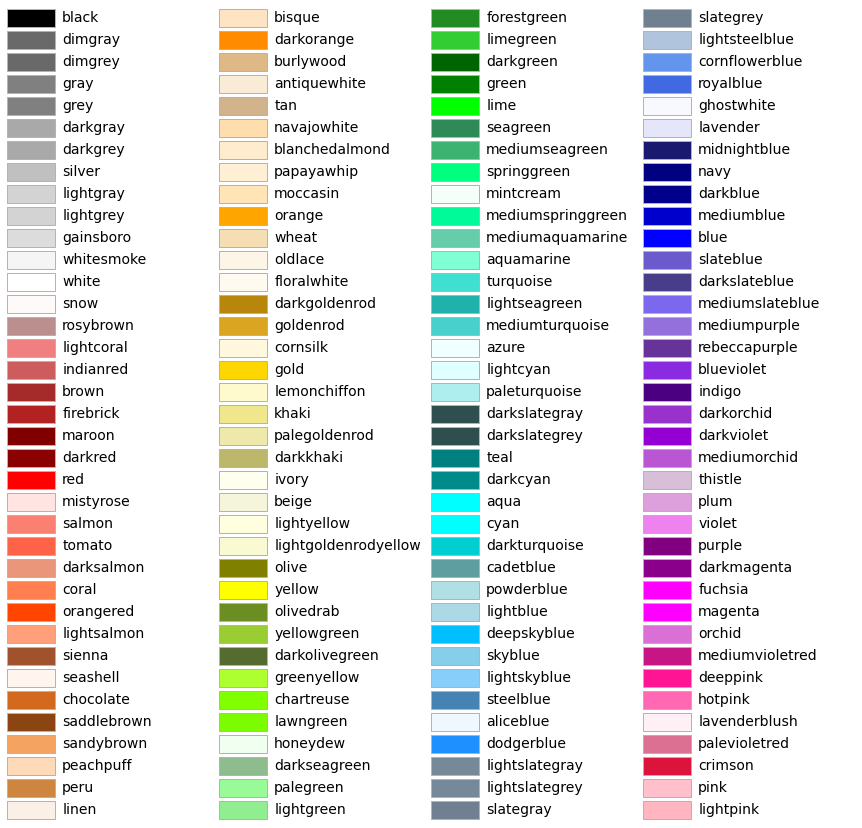

In [37]:
plot_colortable(mcolors.CSS4_COLORS)
plt.show()

In [92]:
alt_ci_law_2

array([2.19499475e+12, 2.18166457e+12, 2.16813943e+12, 2.15448839e+12,
       2.14065808e+12, 2.12664704e+12, 2.11246163e+12, 2.09810709e+12,
       2.08358780e+12, 2.06891202e+12, 2.05407271e+12, 2.03907016e+12,
       2.02391574e+12, 2.00860332e+12, 1.99313077e+12, 1.97749592e+12,
       1.96169482e+12, 1.94574747e+12, 1.92967489e+12, 1.91342682e+12,
       1.89704829e+12, 1.88052960e+12, 1.86386270e+12, 1.84706729e+12,
       1.83014357e+12, 1.81306157e+12, 1.79589583e+12, 1.77859398e+12,
       1.76116274e+12, 1.74361259e+12, 1.72595239e+12, 1.70819038e+12,
       1.69032813e+12, 1.67237362e+12, 1.65432754e+12, 1.63619111e+12,
       1.61796317e+12, 1.59964155e+12, 1.58125980e+12, 1.56281192e+12,
       1.54427221e+12, 1.52570979e+12, 1.50706077e+12, 1.48838161e+12,
       1.46965628e+12, 1.45087875e+12, 1.43206336e+12, 1.41324257e+12,
       1.39439388e+12, 1.37552546e+12, 1.35664312e+12, 1.33775111e+12,
       1.31887736e+12, 1.30000966e+12, 1.28114321e+12, 1.26229100e+12,
      

In [ ]:
exponents_dataframe

,R0,scaled_dbar,A,alpha,kappa_star
0,1.5,0.011721,1.037111e+23,-7.969765,772.489670
0,1.5,0.013738,5.063233e+08,-3.096495,647.229297
0,1.5,0.016103,4.332900e+06,-2.390883,596.856357
0,1.5,0.018874,5.873115e+05,-2.109230,543.324248
0,1.5,0.022122,1.416305e+05,-1.909280,498.836489
...,...,...,...,...,...
0,10.0,0.529832,1.360919e+00,-0.528302,1.791948
0,10.0,0.621017,1.505653e+00,-0.517878,2.203837
0,10.0,0.727895,1.724844e+00,-0.523889,2.830791
0,10.0,0.853168,1.924832e+00,-0.519581,3.526554


(0.1, 1000000.0)

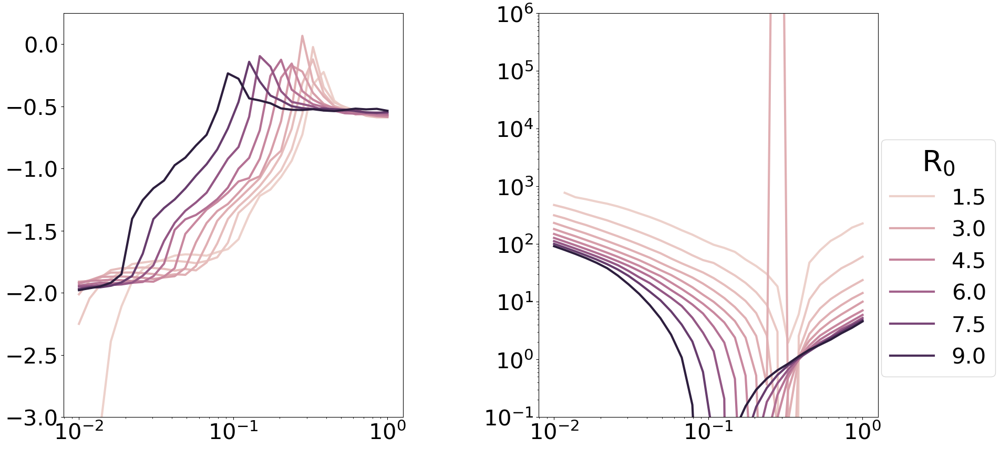

In [ ]:
fit_params = np.array(fit_params)
fig,ax= plt.subplots(1,2,figsize=(20,10))
plt.subplots_adjust(wspace=0.4)
sns.lineplot(data=exponents_dataframe, x='scaled_dbar', y='alpha', ax=ax[0], hue= 'R0',legend = False)
sns.lineplot(data=exponents_dataframe, x='scaled_dbar', y='kappa_star', ax=ax[1], hue= 'R0')

for a in ax:
    a.set_xscale('log')
    # a.set_yscale('log')
    # a.set_xlim(right =.1)

    a.set_xlabel(r'')
    a.set_ylabel(r'')
    # a.set_xlabel(r'$\frac{\langle d \rangle}{\xi}$')
ax[1].set_yscale('log')
ax[0].set_ylim(bottom=-3,top=.25)
ax[1].legend(title=r'$R_0$', loc=(1.01,0.1), fontsize=30)
ax[1].set_ylim(top=1e6, bottom=1e-1)
# plt.savefig(output_folder+'/phase_diagram_plaw_alpha_kappastar.svg', bbox_inches='tight')

In [ ]:
fit_params = np.array(fit_params)

In [ ]:
exponents_dataframe['kappa_times_delta'] = exponents_dataframe['scaled_dbar']/(1+exponents_dataframe['scaled_dbar'])*exponents_dataframe['kappa_star']

In [ ]:
sns.set_style('ticks')

(0.0, 10.0)

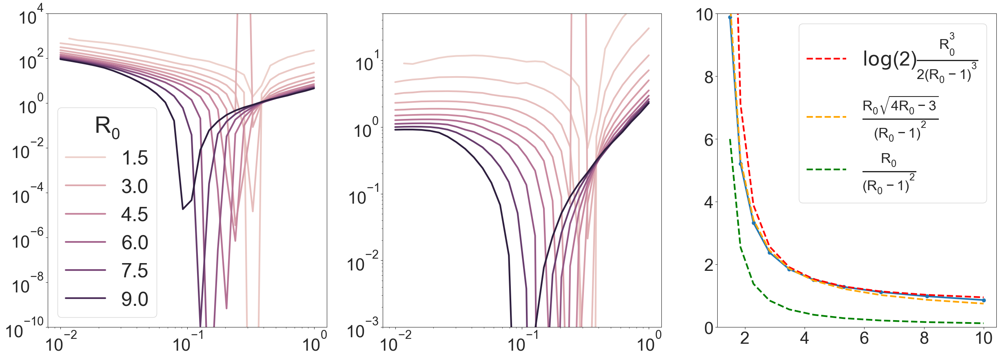

In [ ]:
fit_params = np.array(fit_params)
fig,ax= plt.subplots(1,3,figsize=(30,10))
plt.subplots_adjust(wspace=0.2)
sns.lineplot(data=exponents_dataframe, x='scaled_dbar', y='kappa_star', ax=ax[0], hue= 'R0')
sns.lineplot(data=exponents_dataframe, x='scaled_dbar', y='kappa_times_delta', ax=ax[1], hue= 'R0',legend = False)

r_R0 = exponents_dataframe.query('scaled_dbar<3e-2').groupby('R0').mean()['kappa_times_delta']
ax[2].plot(R0s, r_R0, marker='o')
# ax[2].plot(R0s, 5/(R0s-1), color='black', linestyle='--',label = r'$\frac{5}{R_0-1}$')
# ax[2].plot(R0s,   R0s**2/(R0s-1)**2, color='orange', linestyle='--',label = r'$\frac{R_0^2}{(R_0-1)^2}$')
ax[2].plot(R0s,  np.log(2)*  R0s**3/(R0s-1)**3, color='red', linestyle='--',label = r'$\log(2)\frac{R_0^3}{2(R_0-1)^3}$')
# ax[2].plot(R0s, R0s**2/(R0s-1)**2, color='orange', linestyle='--')
ax[2].plot(R0s, R0s*(np.sqrt(4*R0s-3))/(R0s-1)**2, color='orange', linestyle='--',label=r'$\frac{R_0\sqrt{4R_0-3}}{(R_0-1)^2}$')
# ax[2].plot(R0s,  1/2*  R0s**4/((R0s-1)**4), color='blue', linestyle='--',label = r'$\frac{R_0^4}{2(R_0-1)^2}$')
ax[2].plot(R0s,   R0s/(R0s-1)**2, color='green', linestyle='--',label = r'$\frac{R_0}{(R_0-1)^2}$')
ax[2].legend(loc='best')


for a in ax[:2]:
    a.set_xscale('log')
    # a.set_yscale('log')
    # a.set_xlim(right =.1)

    a.set_xlabel(r'')
    a.set_ylabel(r'')
    # a.set_xlabel(r'$\frac{\langle d \rangle}{\xi}$')
ax[0].set_yscale('log')
ax[0].set_ylim(bottom=1e-10,top=5e1)
ax[1].set_yscale('log')
ax[1].set_ylim(bottom=1e-3,top=5e1)
ax[0].legend(title=r'$R_0$')

# ax[0].legend(title=r'$R_0$', loc=(1.01,0.1), fontsize=30)
ax[0].set_ylim(top=1e4)
ax[-1].set_ylim(top=10, bottom=0)
# plt.savefig(output_folder+'phase_diagram_plaw_kappastar_kappatimesdelta.svg', bbox_inches='tight')

In [ ]:
AAAAA

NameError: name 'AAAAA' is not defined

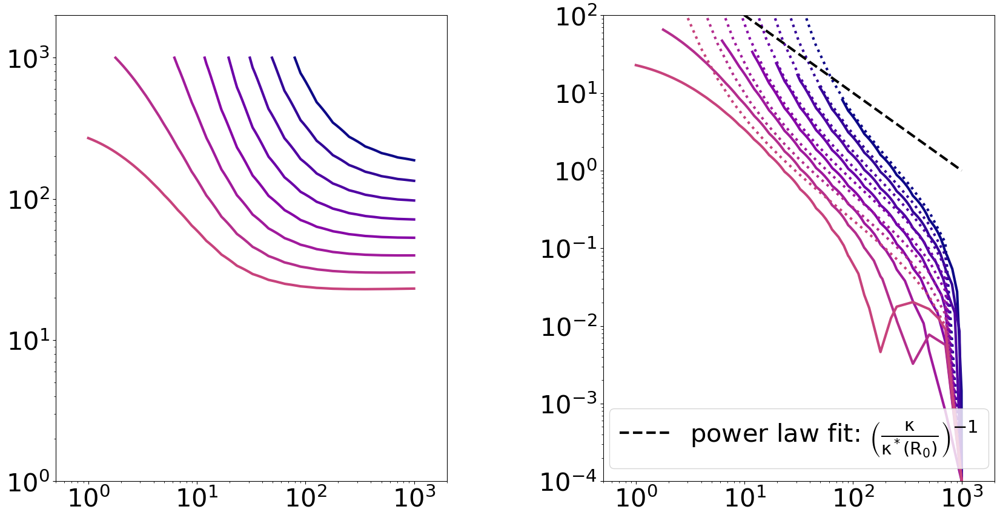

In [ ]:
colors_scaled_dbar= funcs.color_dict(evolution_pd['scaled_dbar'].unique(),plt.cm.plasma)

for R0 in [R0s[3]]:
    fig,ax= plt.subplots(1,2,figsize=(20,10))
    plt.subplots_adjust(wspace=0.4)

    delta_s_from_df = evolution_pd['scaled_dbar'].unique()
    for scaled_dbar in delta_s_from_df[delta_s_from_df<.1][::2]:
        mini_df = (evolution_pd
            .query(f'R0=={R0} and scaled_dbar=={scaled_dbar}')
            .groupby(['kappa_plot', 'muN'])
            .mean()
            .reset_index())


        muN_vals = mini_df['muN'].unique()
        kappa_vals = mini_df['kappa_plot'].unique()
        p_evo_vals = mini_df.pivot(index='muN', columns='kappa_plot', values='p_evo').values
    
        C =ax[0].contour(kappa_vals, muN_vals, p_evo_vals, levels=[0.5],alpha=0)
        Cx, Cy = C.allsegs[0][0].T
        ax[0].plot(Cx, Cy, color=colors_scaled_dbar[scaled_dbar], label = rf'${scaled_dbar:.2e}$')
        rescaled_Cy = Cy*scaled_dbar
        altlaw= R0/(R0-1) * (np.power(1 + R0/((R0-1)*kappa_s),(1-scaled_dbar)/scaled_dbar)-1)
        rescaled_Cy = np.abs(rescaled_Cy - rescaled_Cy[-1]+1e-4)
        ax[1].plot(Cx, rescaled_Cy, color=colors_scaled_dbar[scaled_dbar])#, label = rf'${scaled_dbar:.2e}$')

        #fit Cx, rescaled_Cy to power law
        try:
            fit = np.polyfit(np.log(Cx), np.log(rescaled_Cy), 1)
            fit_fn = np.poly1d(fit)

            altlaw= R0/(R0-1) * (np.power(1 + R0/((R0-1)*kappa_s),(1-scaled_dbar)/scaled_dbar)-1)
            ax[1].plot(kappa_s, altlaw - altlaw[-1]+1e-4, color=colors_scaled_dbar[scaled_dbar], linestyle=':')
        except LinAlgError:
            continue            
        # 
    # ylim = ax[1].get_ylim()
    ax[1].plot(kappa_vals, 1e3/(kappa_vals), color='black', linestyle='--', label =r'power law fit: $ \left(\frac{\kappa}{\kappa^*\left(R_0\right)}\right)^{-1}$')
    # ax[1].set_ylim(ylim)
    ax[0].set_xlim(ax[0].get_xlim()*np.array([.5,2]))
    ax[1].set_xlim(ax[0].get_xlim())
    ax[0].set_yscale('log')
    ax[0].set_xscale('log')
    ax[0].set_xlabel(r'')
    ax[0].set_ylabel(r'')
    ax[1].set_xlabel(r'')
    ax[1].set_ylabel(r'')
    ax[1].legend(loc='lower center', fontsize=30)
    ax[1].set_xscale('log')
    ylogged = True 

    if ylogged:
        ax[1].set_yscale('log')

    ax[0].set_ylim((1,2e3))
    # ax[1].set_ylim((1,90))

    ax[1].set_ylim((1e-4,1e2))

In [ ]:
def get_label_in_exponential_form(lab):
    # print(float(lab.replace('$','')))
    exponent = np.floor(np.log10(float(lab.replace('$',''))))
    mantissa = float(lab.replace('$',''))/10**exponent

    return f'${mantissa:.2f}\cdot 10^{{{exponent:.0f}}}$'

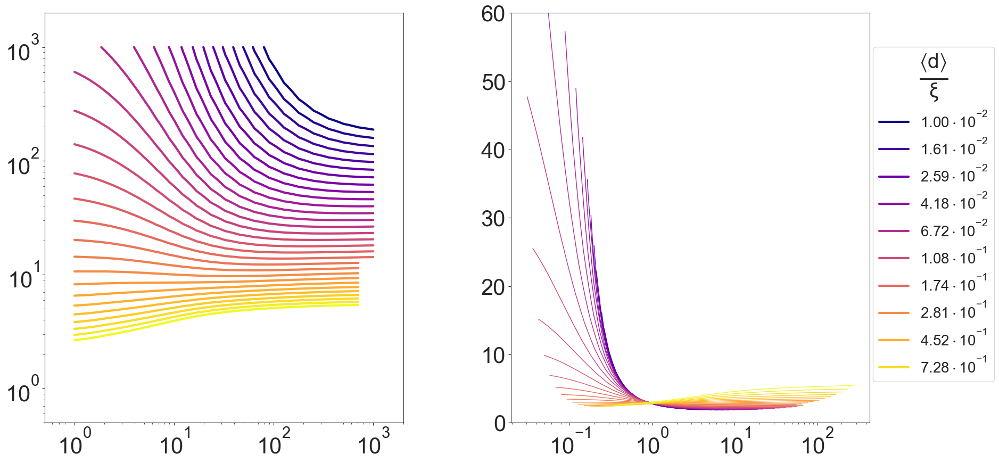

In [ ]:
colors_scaled_dbar= funcs.color_dict(evolution_pd['scaled_dbar'].unique(),plt.cm.plasma)
delta_s_from_df = evolution_pd['scaled_dbar'].unique()
for R0 in [R0s[3]]:
    fig,ax= plt.subplots(1,2,figsize=(20,10))
    plt.subplots_adjust(wspace=0.3)
    
    for scaled_dbar in delta_s_from_df:
        mini_df = (evolution_pd
            .query(f'R0=={R0} and scaled_dbar=={scaled_dbar}')
            .groupby(['kappa_plot', 'muN'])
            .mean()
            .reset_index())
        muN_vals = mini_df['muN'].unique()
        kappa_vals = mini_df['kappa_plot'].unique()
        p_evo_vals = mini_df.pivot(index='muN', columns='kappa_plot', values='p_evo').values
        C =ax[0].contour(kappa_vals, muN_vals, p_evo_vals, levels=[0.5],alpha=0)
        Cx, Cy = C.allsegs[0][0].T
        ax[0].plot(Cx, Cy, color=colors_scaled_dbar[scaled_dbar], label = rf'${scaled_dbar:.2e}$')
        
        rescaled_Cy = Cy*scaled_dbar
        kstar = np.log(2)*(R0/(R0-1))**3 /scaled_dbar
        rescaled_Cx = Cx/kstar
        ax[1].plot(rescaled_Cx, rescaled_Cy , color=colors_scaled_dbar[scaled_dbar], label = rf'${scaled_dbar:.2e}$',lw=1)

    ax[0].set_xlim(ax[0].get_xlim()*np.array([.5,2]))
    ax[0].set_ylim(ax[0].get_ylim()*np.array([.5,2]))
    

    for xi in xi_s:
        delta = dbar/xi
        
        p_alpha= 1/dbar
        exp_val_kappa_inf = mu*N/(xi*p_alpha) * ((R0-1)/R0)**2 /2 # exp must be log 2
        exp_val_kappa0 = mu*N*np.log(R0)/(R0)*np.power(R0/(R0-1),-xi*p_alpha) # exp must be log 2

        equal_proba_point_kappa0 = np.log(2)/(np.log(R0)/(R0)*np.power(R0/(R0-1),-xi*p_alpha))
        equal_proba_point_kappa_inf = np.log(2)/(((R0-1)/R0)**2 /2)*(xi*p_alpha)

    handles, labels= ax[0].get_legend_handles_labels()
    handles = handles[::3]
    labels = labels[::3]
    labels = [get_label_in_exponential_form(lab) for lab in labels]

    ax[0].set_yscale('log')
    ax[0].set_xscale('log')
    ax[0].set_xlabel(r'')
    ax[0].set_ylabel(r'')
    ax[1].set_xlabel(r'')
    ax[1].set_ylabel(r'')
    ax[1].set_xscale('log')
    ylogged = False

    if ylogged:
        ax[1].set_yscale('log')

        ax[1].set_ylim(ax[1].get_ylim()*np.array([.5,2]))
    else:
        ax[1].set_ylim((0,60))

    ax[1].legend(handles,labels, title= r'$\frac{\langle d\rangle}{\xi}$',loc=(1.01,0.1), fontsize=20)
    # os.makedirs(os.getcwd()+'/figures', exist_ok=True)
    plt.savefig(output_folder+'/phase_diagram_mountain_logy{ylogged}.svg', bbox_inches='tight')

In [ ]:
R0

2.8231080866430855

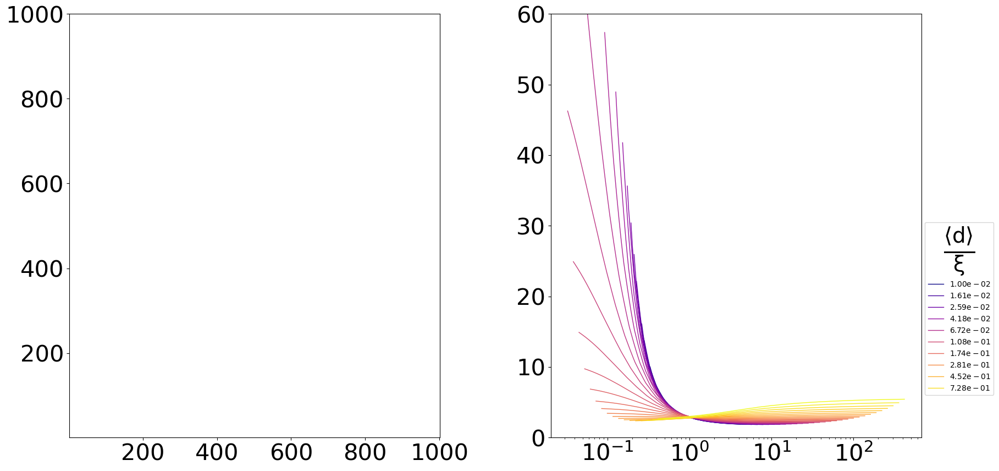

In [ ]:
colors_scaled_dbar= funcs.color_dict(evolution_pd['scaled_dbar'].unique(),plt.cm.plasma)
delta_s_from_df = evolution_pd['scaled_dbar'].unique()
for R0 in [R0s[3]]:
    fig,ax= plt.subplots(1,2,figsize=(20,10))
    plt.subplots_adjust(wspace=0.3)
    
    for scaled_dbar in delta_s_from_df:
        mini_df = (evolution_pd
            .query(f'R0=={R0} and scaled_dbar=={scaled_dbar}')
            .groupby(['kappa_plot', 'muN'])
            .mean()
            .reset_index())
        muN_vals = mini_df['muN'].unique()
        kappa_vals = mini_df['kappa_plot'].unique()
        p_evo_vals = mini_df.pivot(index='muN', columns='kappa_plot', values='p_evo').values
        C =ax[0].contour(kappa_vals, muN_vals, p_evo_vals, levels=[0.5],alpha=0)
        Cx, Cy = C.allsegs[0][0].T
        
        rescaled_Cy = Cy*scaled_dbar
        kstar = (R0/(R0-1))**2 /scaled_dbar
        rescaled_Cx = Cx/kstar
        ax[1].plot(rescaled_Cx, rescaled_Cy , color=colors_scaled_dbar[scaled_dbar], label = rf'${scaled_dbar:.2e}$',lw=1)
    # ax[1].set_xlim(ax[0].get_xlim()
    handles, labels= ax[1].get_legend_handles_labels()

    for xi in xi_s:
        delta = dbar/xi
        
        p_alpha= 1/dbar
        exp_val_kappa_inf = mu*N/(xi*p_alpha) * ((R0-1)/R0)**2 /2 # exp must be log 2
        exp_val_kappa0 = mu*N*np.log(R0)/(R0)*np.power(R0/(R0-1),-xi*p_alpha) # exp must be log 2

        equal_proba_point_kappa0 = np.log(2)/(np.log(R0)/(R0)*np.power(R0/(R0-1),-xi*p_alpha))
        equal_proba_point_kappa_inf = np.log(2)/(((R0-1)/R0)**2 /2)*(xi*p_alpha)
        # p_evo_kappa0 = 1- np.exp(-mu*N*np.log(R0)/(R0)*np.power(R0/(R0-1),-xi*p_alpha) )

    handles = handles[::3]
    labels = labels[::3]
    ax[1].set_xlabel(r'')
    ax[1].set_ylabel(r'')
    ax[1].set_xscale('log')
    ylogged = False

    if ylogged:
        ax[1].set_yscale('log')

        ax[1].set_ylim(ax[1].get_ylim()*np.array([.5,2]))
    else:
        ax[1].set_ylim((0,60))
    # ax[0].set_ylim((1,2e3))
    # ax[1].set_ylim((1,90))

    ax[1].legend(handles,labels, title= r'$\frac{\langle d\rangle}{\xi}$',loc=(1.01,0.1), fontsize=10)
    # os.makedirs(os.getcwd()+'/figures', exist_ok=True)
    # plt.savefig(os.getcwd()+f'/figures/phase_diagram_mountain_logy{ylogged}.svg', bbox_inches='tight')

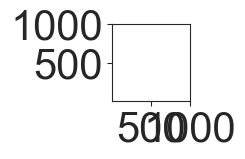

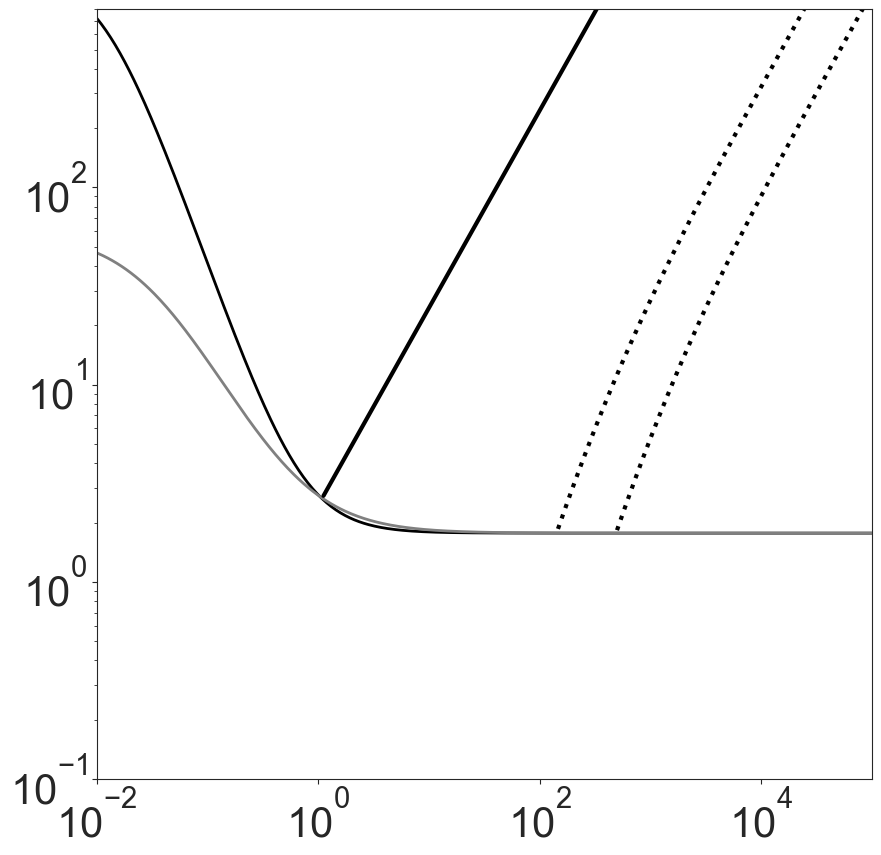

In [ ]:
colors_scaled_dbar= funcs.color_dict(evolution_pd['scaled_dbar'].unique(),plt.cm.plasma)
delta_s_from_df = evolution_pd['scaled_dbar'].unique()
fig_ghost,ax_ghost = plt.subplots(1,1,figsize=(1,1))

for R0 in [R0s[3]]:
    fig,ax= plt.subplots(1,1,figsize=(10,10))
    plt.subplots_adjust(wspace=0.3)
    
    for i_d, scaled_dbar in enumerate(delta_s_from_df[np.array([12, 16])]):
        mini_df = (evolution_pd
            .query(f'R0=={R0} and scaled_dbar=={scaled_dbar}')
            .groupby(['kappa_plot', 'muN'])
            .mean()
            .reset_index())
        muN_vals = mini_df['muN'].unique()
        kappa_vals = mini_df['kappa_plot'].unique()
        p_evo_vals = mini_df.pivot(index='muN', columns='kappa_plot', values='p_evo').values
        C =ax_ghost.contour(kappa_vals, muN_vals, p_evo_vals, levels=[0.5],alpha=0)
        Cx, Cy = C.allsegs[0][0].T
        rescaled_Cy = Cy*scaled_dbar
        rescaled_Cy_subtracted = np.abs(rescaled_Cy - rescaled_Cy[-1]+1e-4)
    
        #fit Cx, rescaled_Cy to power law
        try:
            fit = np.polyfit(np.log(Cx[:-1]), np.log(rescaled_Cy_subtracted)[:-1], 1)
            fit_fn = np.poly1d(fit)
            exponent = fit_fn[1] 
        except LinAlgError:
            continue   

        kstar = R0*np.sqrt(4*R0-3)/(scaled_dbar*(R0-1)**2)
        rescaled_Cx = Cx/kstar
        xs= np.logspace(-2,5,500)
        z_inf_inf = (R0-1)/R0
        if i_d ==0:
            color= 'k'
        else:
            color='grey'

        equal_proba_point_kappa_inf = np.log(2)/((-z_inf_inf-np.log(1-z_inf_inf)))#*delta_s_from_df)
        equal_proba_point_kappa0 = np.log(2)/(np.log(R0)/(R0)*np.power(R0/(R0-1),-1/scaled_dbar))
        law = equal_proba_point_kappa_inf + (equal_proba_point_kappa0-equal_proba_point_kappa_inf)/( 1+  (equal_proba_point_kappa0-equal_proba_point_kappa_inf) *xs**(-exponent))
        ax.plot(xs, law , color=color, linestyle='-',lw=2)
        alt_early_late_law = (2*(-1 + R0)**5*xs**2*scaled_dbar**4)/(np.sqrt(-3 + 4*R0)*(1 + scaled_dbar)*(R0**2*np.sqrt(-3 + 4*R0) + (-1 + R0)**3*xs*scaled_dbar**2))
        ax.plot(xs[alt_early_late_law>=law],alt_early_late_law[alt_early_late_law>=law],color='black',ls=':')
    early_late_law =  R0*np.sqrt(4*R0-3)/((R0-1)**2) * xs
    ax.plot(xs[early_late_law>=law],early_late_law[early_late_law>=law],color='black')

    ax.set_xscale('log')
    ylogged = True

    if ylogged:
        ax.set_yscale('log')
        ax.set_ylim(np.array([1e-1,8e2]))
        ax.set_xlim(np.array([1e-2,1e5]))
    else:
        ax.set_ylim((0,60))

# plt.savefig(output_folder+'/fig2.svg', bbox_inches='tight')


In [ ]:
30*9/4

67.5

In [ ]:
fit_fn[1]

-1.3729149279928896

In [ ]:
#turn warnings off
import warnings

warnings.filterwarnings('ignore')

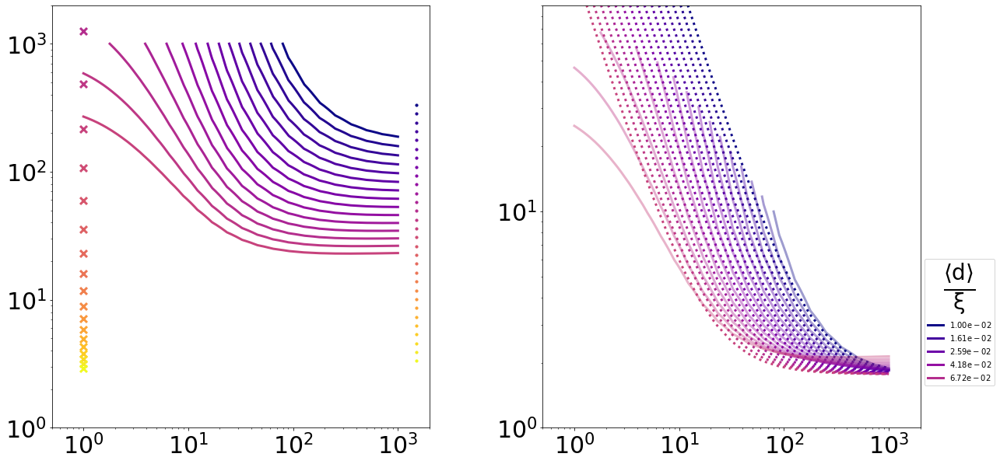

In [ ]:
# delta_s_from_df = evolution_pd['scaled_dbar'].unique()
colors_scaled_dbar= funcs.color_dict(evolution_pd['scaled_dbar'].unique(),plt.cm.plasma)

for R0 in [R0s[3]]:
    fig,ax= plt.subplots(1,2,figsize=(20,10))
    plt.subplots_adjust(wspace=0.3)

    
    for scaled_dbar in delta_s_from_df[delta_s_from_df<.1]:
        mini_df = (evolution_pd
            .query(f'R0=={R0} and scaled_dbar=={scaled_dbar}')
            .groupby(['kappa_plot', 'muN'])
            .mean()
            .reset_index())


        muN_vals = mini_df['muN'].unique()
        kappa_vals = mini_df['kappa_plot'].unique()
        p_evo_vals = mini_df.pivot(index='muN', columns='kappa_plot', values='p_evo').values

        C =ax[0].contour(kappa_vals, muN_vals, p_evo_vals, levels=[0.5],alpha=0)
        Cx, Cy = C.allsegs[0][0].T
        ax[0].plot(Cx, Cy, color=colors_scaled_dbar[scaled_dbar], label = rf'${scaled_dbar:.2e}$')
        ax[1].plot(Cx, Cy*scaled_dbar, color=colors_scaled_dbar[scaled_dbar], label = rf'${scaled_dbar:.2e}$',alpha=.4)
        equal_proba_point_kappa0 = np.log(2)/(np.log(R0)/(R0)*np.power(R0/(R0-1),-1/scaled_dbar))
        z_inf_inf= (R0-1)/R0
        equal_proba_point_kappa_inf = np.log(2)/((-z_inf_inf-np.log(1-z_inf_inf))*scaled_dbar)

        dMuN_inf = scaled_dbar*equal_proba_point_kappa_inf
        k_star = 1/scaled_dbar * (R0/(R0-1))**2
        dMuN_k = dMuN_inf + (kappa_s/k_star)**(-1.5)

        ax[1].plot(kappa_s, dMuN_k,linestyle = ':', color=colors_scaled_dbar[scaled_dbar])

    ax[0].set_xlim(ax[0].get_xlim()*np.array([.5,2]))
    ax[1].set_xlim(ax[0].get_xlim())
    ax[0].set_ylim(ax[0].get_ylim()*np.array([.5,2]))
    ax[1].set_ylim(ax[1].get_ylim()*np.array([.5,2]))

    for xi in xi_s:
        delta = dbar/xi
        
        p_alpha= 1/dbar
        exp_val_kappa_inf = mu*N/(xi*p_alpha) * ((R0-1)/R0)**2 /2 # exp must be log 2
        exp_val_kappa0 = mu*N*np.log(R0)/(R0)*np.power(R0/(R0-1),-xi*p_alpha) # exp must be log 2

        equal_proba_point_kappa0 = np.log(2)/(np.log(R0)/(R0)*np.power(R0/(R0-1),-xi*p_alpha))
        equal_proba_point_kappa_inf = np.log(2)/(((R0-1)/R0)**2 /2)*(xi*p_alpha)
        # p_evo_kappa0 = 1- np.exp(-mu*N*np.log(R0)/(R0)*np.power(R0/(R0-1),-xi*p_alpha) )
        ax[0].scatter(1,equal_proba_point_kappa0, marker='x', color=colors_scaled_dbar[delta],s=80)
        ax[0].scatter(1.5*kappa_s[-1] ,equal_proba_point_kappa_inf, s=10, marker='o',color=colors_scaled_dbar[delta])


    handles, labels= ax[0].get_legend_handles_labels()
    handles = handles[::3]
    labels = labels[::3]


    ax[0].set_yscale('log')
    ax[0].set_xscale('log')
    ax[0].set_xlabel(r'')
    ax[0].set_ylabel(r'')
    ax[1].set_xlabel(r'')
    ax[1].set_ylabel(r'')

    ax[1].set_xscale('log')
    ylogged = True 

    if ylogged:
        ax[1].set_yscale('log')

    ax[0].set_ylim((1,2e3))
    ax[1].set_ylim((1,90))

    ax[1].legend(handles,labels, title= r'$\frac{\langle d\rangle}{\xi}$',loc=(1.01,0.1), fontsize=10)

(1, 2000.0)

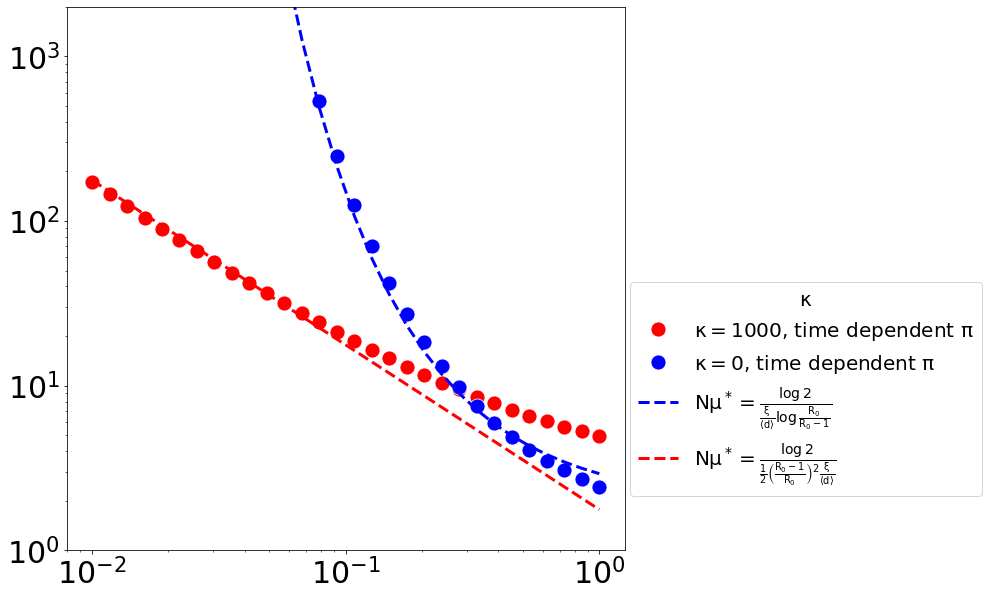

In [ ]:
R0 = R0s[3]
p_50_m = .42
p_50_M = .52
fig,ax = plt.subplots(1,figsize=(10,10))
sns.lineplot(data=evolution_pd
             .query(f'R0=={R0} & kappa=={kappa_s[-1]} & p_evo>{p_50_m} & p_evo<{p_50_M}'), x='scaled_dbar', y='muN', palette=colors_scaled_dbar, linestyle='',marker='o',ms=15, label = fr'$\kappa={kappa_s[-1]:.0f}$, time dependent $\pi$', color= 'red',err_style=None)
sns.lineplot(data=evolution_pd
             .query(f'R0=={R0} & kappa=={kappa_s[0]} & p_evo>{p_50_m} & p_evo<{p_50_M}'), x='scaled_dbar', y='muN', palette=colors_scaled_dbar, linestyle='',marker='o',ms=15, label = fr'$\kappa={kappa_s[0]:.0f}$, time dependent $\pi$', color= 'blue',err_style=None)

# sns.lineplot(data=evolution_pd_adiabatic
#                 .query(f'R0=={R0} & kappa=={kappa_s[-1]} & p_evo>{p_50_m} & p_evo<{p_50_M}'), x='scaled_dbar', y='muN', palette=colors_scaled_dbar, linestyle='',marker='X',ms=15,color='red')

# sns.lineplot(data=evolution_pd_adiabatic
#                 .query(f'R0=={R0} & kappa=={kappa_s[0]} & p_evo>{p_50_m} & p_evo<{p_50_M}'), x='scaled_dbar', y='muN', palette=colors_scaled_dbar, linestyle='',marker='X',ms=15,color='blue')

equal_proba_point_kappa0 = np.log(2)/(np.log(R0)/(R0)*np.power(R0/(R0-1),-xi_s*p_alpha))

#summed =  ((-1 + E^(1/\[Xi])) (1 - p_alpha))/((1 - p_alpha) p_alpha (-1 + E^(1/\[Xi]) + p_alpha))
summed = lambda p_alpha, xi: ((-1 + np.exp(1/xi)) )/( p_alpha * (-1 + np.exp(1/xi)) + p_alpha)
summed_xis = np.array([summed(p_alpha=1/dbar, xi=xi) for xi in xi_s])
                              
equal_proba_point_kappa_inf = np.log(2)/((R0/(R0-1))**2 )*(xi_s*p_alpha)
z_inf_inf= (R0-1)/R0
int_z= -z_inf_inf - np.log(1-z_inf_inf)
equal_proba_point_kappa_inf = np.log(2)/((-z_inf_inf-np.log(1-z_inf_inf))*delta_s_from_df)

ax.plot(delta_s, equal_proba_point_kappa0, color='blue', linestyle='--', label = r'$N \mu^*=\frac{\log 2}{ \frac{\xi}{\langle d\rangle} \log \frac{R_0}{R_0-1}}$')
ax.plot(delta_s, equal_proba_point_kappa_inf, color='red', linestyle='--', label = r'$N \mu^*=\frac{\log 2}{\frac{1}{2}\left(\frac{R_0-1}{R_0}\right)^2 \frac{\xi}{\langle d\rangle}}$')

ax.legend(title= r'$\kappa$',loc=(1.01,0.1), fontsize=20, title_fontsize=20)

ax.set_xlabel(r'')
ax.set_ylabel(r'')

ax.set_xscale('log')
ax.set_yscale('log')
ax.set_ylim((1,2e3))

# plt.savefig(os.getcwd()+f'/figures/phase_diagram_mountain_extremes.pdf', bbox_inches='tight')

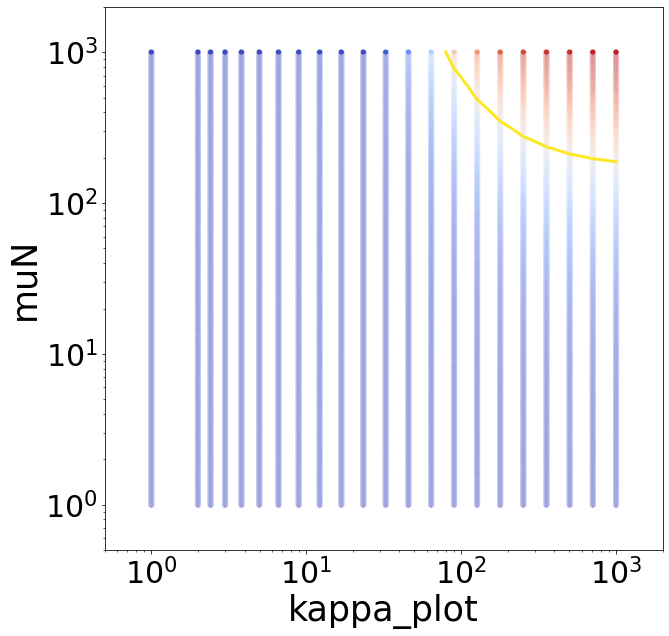

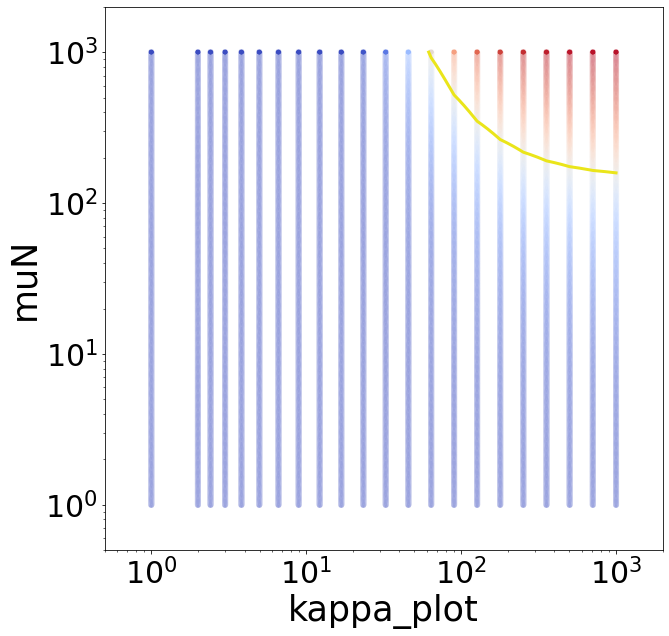

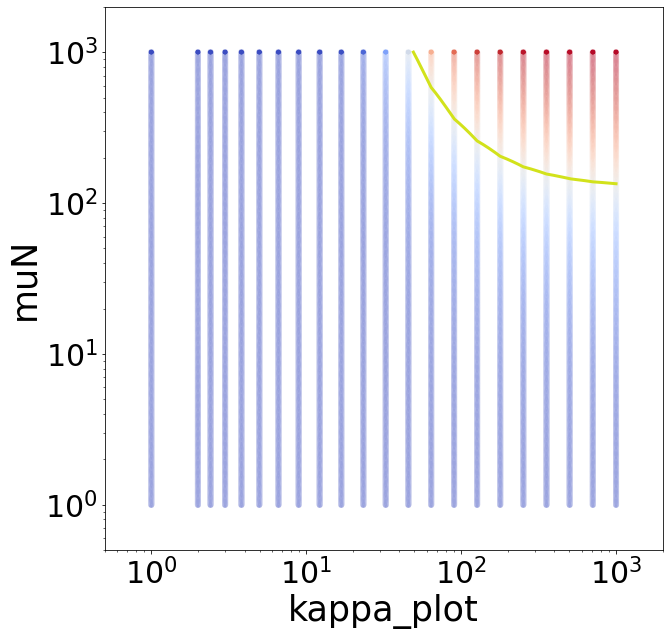

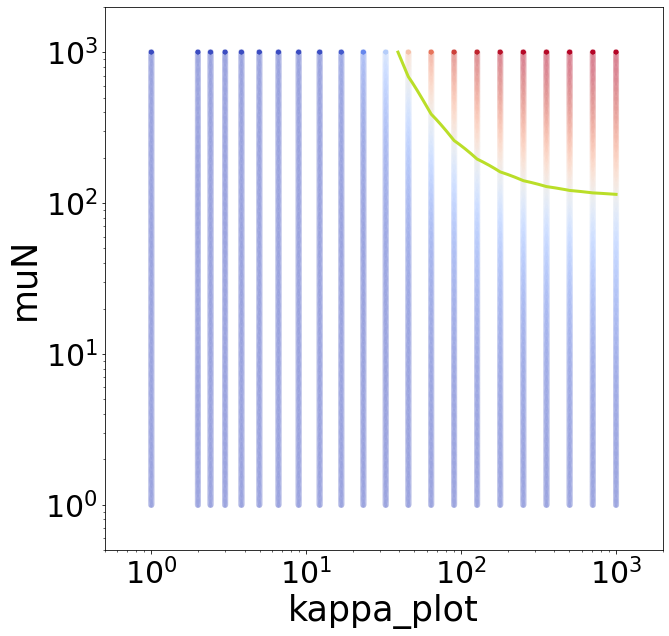

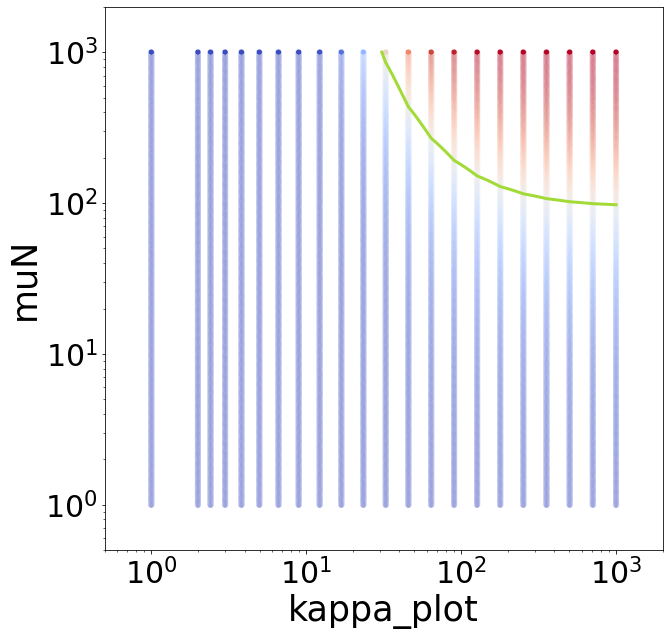

...

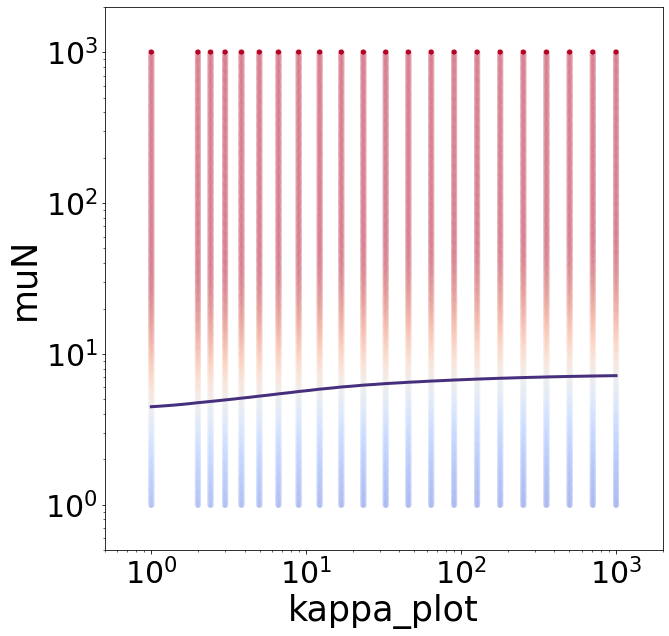

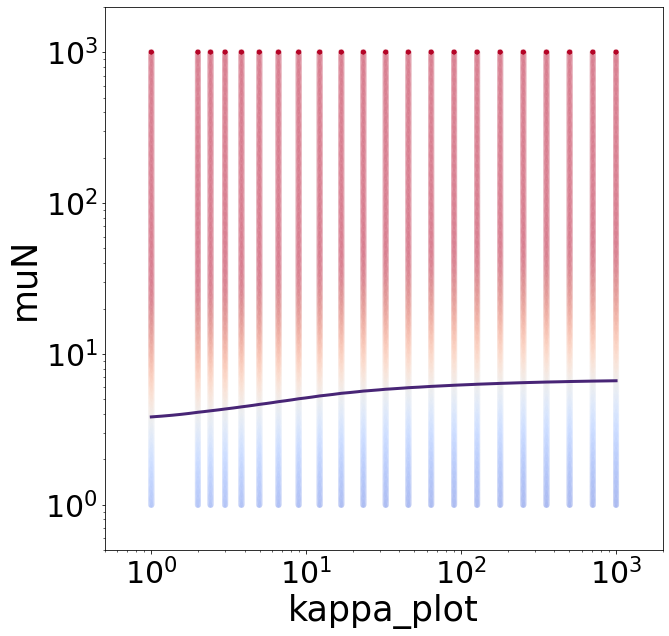

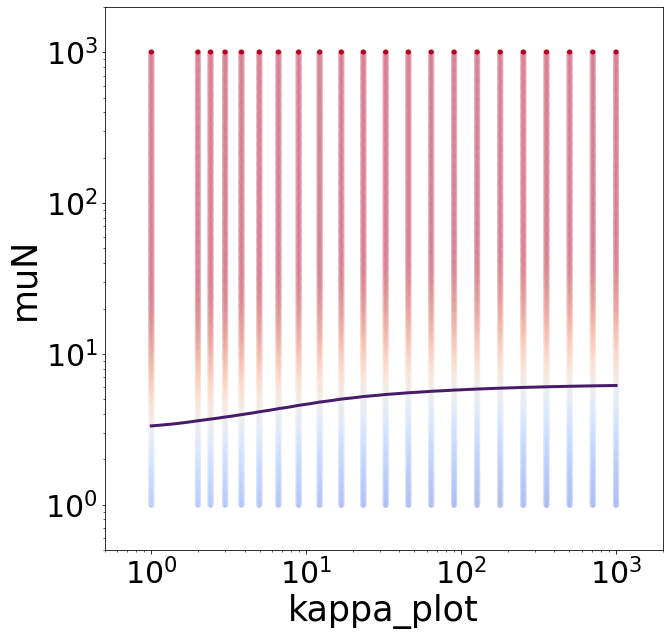

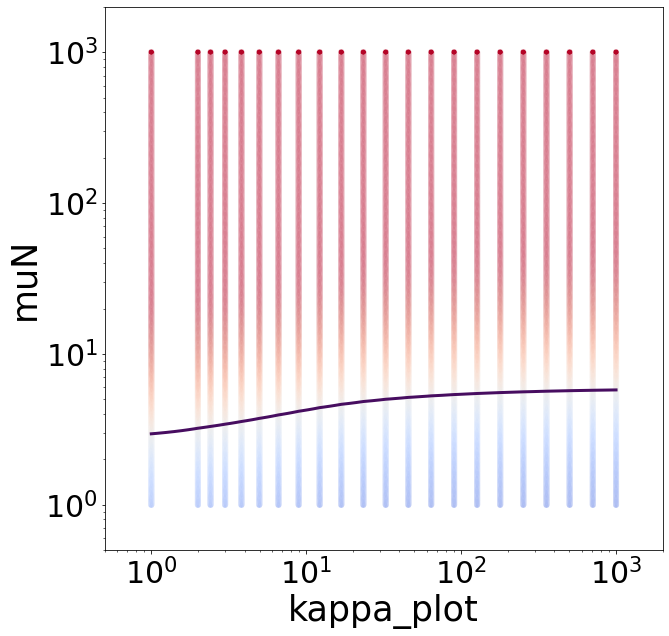

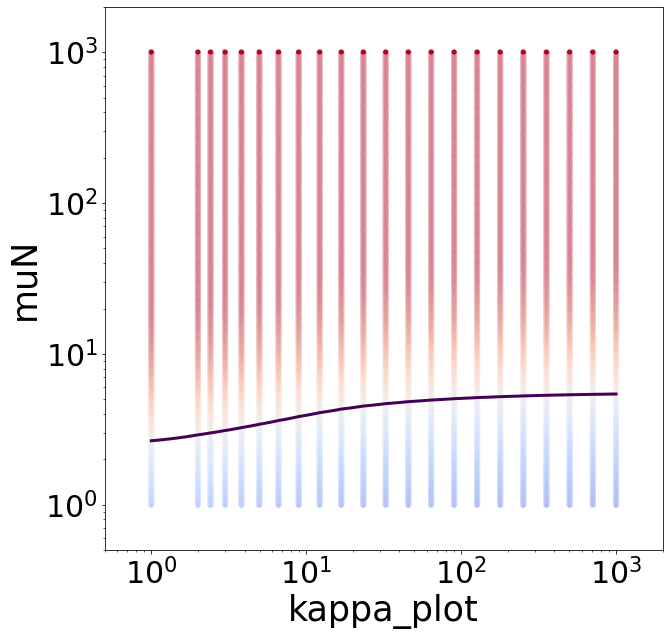

In [ ]:
colors_scaled_dbar= funcs.color_dict(evolution_pd['scaled_dbar'].unique(),plt.cm.viridis_r)

for scaled_dbar in evolution_pd['scaled_dbar'].unique():
    fig,ax= plt.subplots(figsize=(10,10))
    mini_df = (evolution_pd
           .query(f'R0=={R0} and scaled_dbar=={scaled_dbar}')
           .groupby(['kappa_plot', 'muN'])
           .mean()
           .reset_index())


    muN_vals = mini_df['muN'].unique()
    kappa_vals = mini_df['kappa_plot'].unique()
    p_evo_vals = mini_df.pivot(index='muN', columns='kappa_plot', values='p_evo').values
    C =ax.contour(kappa_vals, muN_vals, p_evo_vals, levels=[0.5],alpha=0)
    Cx, Cy = C.allsegs[0][0].T
    ax.plot(Cx, Cy, color=colors_scaled_dbar[scaled_dbar], label = rf'$\bar{{d}}/\xi={scaled_dbar:.2f}$')

    #scatterplot with colors between 0 and 1
    sns.scatterplot(data=mini_df, x='kappa_plot', y='muN', ax=ax, hue='p_evo', palette='coolwarm', legend=False, zorder=0,hue_norm=(0,1))
    # sns.scatterplot(data=mini_df.query(' p_evo>.15'), x='kappa_plot', y='muN', ax=ax, palette=['red'], legend=False, zorder=0)             
    # ax[1].set_ylim(ylim)
    ax.set_xlim(ax.get_xlim()*np.array([.5,2]))
    ax.set_ylim(ax.get_ylim()*np.array([.5,2]))
    ax.set_yscale('log')
    ax.set_xscale('log')